In [1]:
from __future__ import print_function
import numpy as np # Biblioteca de funciones matematicas de alto nivel
np.random.seed(1337)  # for reproducibility
import tensorflow as tf
import keras  
import pandas as pd

In [2]:
dataset = pd.read_csv('train_data2.csv', encoding = "ISO-8859-1") # lectura de datos
dataset1 = pd.read_csv('test_data1.csv', encoding = "ISO-8859-1") # lectura de datos
dataset2 = pd.read_csv('validation_data1.csv', encoding = "ISO-8859-1") # lectura de datos

In [3]:
#Extra check, but we drop inf and nan after 

dataset.replace([np.inf, -np.inf], -1, inplace=True) 
dataset.replace([np.nan, -np.nan], -1, inplace=True)

dataset1.replace([np.inf, -np.inf], -1, inplace=True) 
dataset1.replace([np.nan, -np.nan], -1, inplace=True)

dataset2.replace([np.inf, -np.inf], -1, inplace=True) 
dataset2.replace([np.nan, -np.nan], -1, inplace=True)

In [4]:
# Convert numeric dataset columns to Float

numeric_columns = dataset.select_dtypes(include=['int64', 'float64']).columns
for column in numeric_columns:
    dataset[column] = dataset[column].astype(float)

numeric_columns1 = dataset1.select_dtypes(include=['int64', 'float64']).columns
for column in numeric_columns1:
    dataset1[column] = dataset1[column].astype(float)

numeric_columns1 = dataset2.select_dtypes(include=['int64', 'float64']).columns
for column in numeric_columns1:
    dataset2[column] = dataset2[column].astype(float)

In [5]:
# Eliminar espacios en blanco de los nombres de las columnas
dataset.columns = dataset.columns.str.strip()
dataset1.columns = dataset1.columns.str.strip()
dataset2.columns = dataset2.columns.str.strip()

# Convertir los nombres de las columnas a minúsculas
#dataset.columns = dataset.columns.str.lower()
#dataset1.columns = dataset1.columns.str.lower()
#dataset2.columns = dataset2.columns.str.lower()

# Usar el nombre de la columna correcto
Labels = dataset['Label'].unique()
Y_train = dataset["Label"]
Y_test = dataset1["Label"]
Y_validation = dataset2["Label"]

Bwd PSH Flags
Fwd URG Flags
Bwd URG Flags
FIN Flag Count
PSH Flag Count
ECE Flag Count
Fwd Avg Bytes/Bulk
Fwd Avg Packets/Bulk
Fwd Avg Bulk Rate
Bwd Avg Bytes/Bulk
Bwd Avg Packets/Bulk
Bwd Avg Bulk Rate


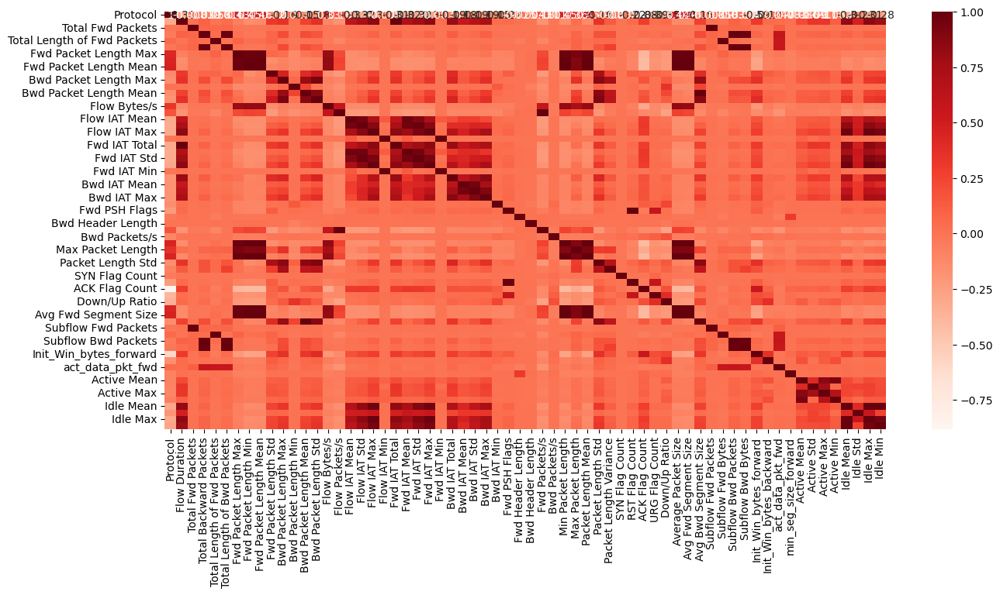

Columnas de X_train:
Index(['Protocol', 'Flow Duration', 'Total Fwd Packets',
       'Total Backward Packets', 'Total Length of Fwd Packets',
       'Total Length of Bwd Packets', 'Fwd Packet Length Max',
       'Fwd Packet Length Min', 'Fwd Packet Length Mean',
       'Fwd Packet Length Std', 'Bwd Packet Length Max',
       'Bwd Packet Length Min', 'Bwd Packet Length Mean',
       'Bwd Packet Length Std', 'Flow Bytes/s', 'Flow Packets/s',
       'Flow IAT Mean', 'Flow IAT Std', 'Flow IAT Max', 'Flow IAT Min',
       'Fwd IAT Total', 'Fwd IAT Mean', 'Fwd IAT Std', 'Fwd IAT Max',
       'Fwd IAT Min', 'Bwd IAT Total', 'Bwd IAT Mean', 'Bwd IAT Std',
       'Bwd IAT Max', 'Bwd IAT Min', 'Fwd PSH Flags', 'Fwd Header Length',
       'Bwd Header Length', 'Fwd Packets/s', 'Bwd Packets/s',
       'Min Packet Length', 'Max Packet Length', 'Packet Length Mean',
       'Packet Length Std', 'Packet Length Variance', 'SYN Flag Count',
       'RST Flag Count', 'ACK Flag Count', 'URG Flag Count', 'Do

<Figure size 640x480 with 0 Axes>

In [6]:
from sklearn.feature_selection import VarianceThreshold
import seaborn as sns
import matplotlib.pyplot as plt

# Asegurarse de que X_train, X_test y X_validation sean DataFrames
X_train = dataset.iloc[:, 0:76]  # Luego obtenemos las características del flujo
X_test = dataset1.iloc[:, 0:76]
X_validation = dataset2.iloc[:, 0:76]
"""
#Elimnar columnas con varianza cero genera error del model.predict
"""
# Identificar y eliminar las columnas con varianza cero
for col in X_train.columns:
    if X_train[col].var() == 0:
        print(col)
        X_train = X_train.drop(col, axis=1)
        X_test = X_test.drop(col, axis=1)
        X_validation = X_validation.drop(col, axis=1)

# Visualizar la matriz de correlación
plt.figure(figsize=(15, 7))
cor = X_train.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.Reds)
plt.show()

features = list(X_train.columns)

plt.savefig('line_plot.svg')

# Imprimir los nombres de las columnas de X_train, X_test y X_validation antes de escalar
print("Columnas de X_train:")
print(X_train.columns)

print("Columnas de X_test:")
print(X_test.columns)

print("Columnas de X_validation:")
print(X_validation.columns)

# Comparar los nombres de las columnas
print("¿Las columnas de X_train y X_test coinciden?")
print(list(X_train.columns) == list(X_test.columns))

print("¿Las columnas de X_train y X_validation coinciden?")
print(list(X_train.columns) == list(X_validation.columns))


# Verificar las dimensiones
print("Dimensiones:")
print(f"X_train: {X_train.shape}")
print(f"X_test: {X_test.shape}")
print(f"X_validation: {X_validation.shape}")


In [7]:
# Convertir las etiquetas de texto a números
Y_train_numeric = pd.get_dummies(Y_train).idxmax(axis=1)

# Obtener los nombres de las etiquetas
label_names = Y_train.unique()


In [8]:
Y_train
unique, counts = np.unique(Y_train, return_counts=True)
counts

array([79775, 79460, 79834, 79697, 79602, 79548, 79830, 79755, 79773,
       79828, 79498, 79678, 79463, 79734, 79732, 79745, 79601],
      dtype=int64)

In [9]:
unique

array(['BENIGN', 'DrDoS_DNS', 'DrDoS_LDAP', 'DrDoS_MSSQL', 'DrDoS_NTP',
       'DrDoS_NetBIOS', 'DrDoS_SNMP', 'DrDoS_SSDP', 'DrDoS_UDP', 'LDAP',
       'MSSQL', 'NetBIOS', 'Portmap', 'Syn', 'TFTP', 'UDP', 'UDPLag'],
      dtype=object)

In [10]:
from sklearn.preprocessing import LabelEncoder

lb_make = LabelEncoder()
Y_test = lb_make.fit_transform(Y_test)

Labels1 = lb_make.inverse_transform(Y_test)
Labels1 = list(lb_make.classes_)
Labels1
unique1, counts1 = np.unique(Y_train, return_counts=True)
unique1


array(['BENIGN', 'DrDoS_DNS', 'DrDoS_LDAP', 'DrDoS_MSSQL', 'DrDoS_NTP',
       'DrDoS_NetBIOS', 'DrDoS_SNMP', 'DrDoS_SSDP', 'DrDoS_UDP', 'LDAP',
       'MSSQL', 'NetBIOS', 'Portmap', 'Syn', 'TFTP', 'UDP', 'UDPLag'],
      dtype=object)

In [11]:
# Celda 11: Mapeo de etiquetas y conteo de valores ##DOS UNIFICADO PARA TRAIN DATASET
import pandas as pd

# Diccionario de mapeo
mapping = {
    'DrDoS_DNS': 'DoS',
    'DrDoS_LDAP': 'DoS',
    'DrDoS_MSSQL': 'DoS',
    'DrDoS_NTP': 'DoS',
    'DrDoS_NetBIOS': 'DoS',
    'DrDoS_SNMP': 'DoS',
    'DrDoS_SSDP': 'DoS',
    'DrDoS_UDP': 'DoS',
    # Agrega otros mapeos si es necesario
}

# Mapea las etiquetas en el dataset
dataset['Label'] = dataset['Label'].map(mapping).fillna(dataset['Label'])

# Cuenta los valores de las etiquetas
label_counts = dataset["Label"].value_counts()
print(label_counts)

# Obtén las etiquetas únicas
unique_labels = label_counts.index.to_list()

## Reduccion del dataset DoS para balancearlo
# Encuentra el número mínimo de ocurrencias entre las etiquetas
min_count = label_counts.min()

# Reduce los valores de 'DoS' para que coincidan con el número mínimo de ocurrencias
dos_indices = dataset[dataset['Label'] == 'DoS'].index
reduced_dos_indices = dos_indices[:min_count]

# Crear un nuevo dataset con los valores reducidos de 'DoS'
reduced_dataset = dataset.drop(dos_indices[min_count:])

#Varianza cero columnas despejadas
#Reduced_dataset pasa a tener shape 65, donde Label es la columna 65
#El resto de variables X_train, X_test y X_validation tiene shape 64
#El drop de la columna Label se efectua más adelante porque no podemos eliminar las etiquetas al usarse en el Y_train_reduce
for col in reduced_dataset.columns:
    if col != 'Label' and reduced_dataset[col].var() == 0:
        #print(col)
        reduced_dataset = reduced_dataset.drop(col, axis=1)

# Reducir `dataset` al tamaño de `dataset1`
#reduced_dataset = dataset.sample(n=420910, random_state=42)

print(reduced_dataset['Label'].value_counts())

Label
DoS        637499
LDAP        79828
BENIGN      79775
UDP         79745
Syn         79734
TFTP        79732
NetBIOS     79678
UDPLag      79601
MSSQL       79498
Portmap     79463
Name: count, dtype: int64
Label
LDAP       79828
BENIGN     79775
UDP        79745
Syn        79734
TFTP       79732
NetBIOS    79678
UDPLag     79601
MSSQL      79498
DoS        79463
Portmap    79463
Name: count, dtype: int64


In [12]:
unique, counts = np.unique(Y_test, return_counts=True)
counts

array([   908,  70038, 140018, 139988,  69958], dtype=int64)

In [13]:
dataset1["Label"].value_counts()

Label
DoS                      140018
Information Gathering    139988
Bruteforce                70038
Mirai                     69958
BENIGN                      908
Name: count, dtype: int64

In [14]:
import shap
import pandas as pd
from sklearn.feature_selection import VarianceThreshold
from sklearn.preprocessing import StandardScaler
from sklearn.neural_network import MLPClassifier
from sklearn.pipeline import make_pipeline
from sklearn.pipeline import Pipeline
from sklearn.base import BaseEstimator, TransformerMixin

# Asegurarse de que X_train, X_test y X_validation sean DataFrames
#X_train = pd.DataFrame(X_train)
#X_test = pd.DataFrame(X_test)
#X_validation = pd.DataFrame(X_validation)

# Custom transformer for feature reduction
"""
class FeatureReducer(BaseEstimator, TransformerMixin):
    def __init__(self, zero_var_cols):
        self.zero_var_cols = zero_var_cols
        self.feature_indices_ = None
    
    def fit(self, X, y=None):
        # Get indices of columns to keep
        if isinstance(X, pd.DataFrame):
            all_cols = X.columns
            self.feature_indices_ = [i for i, col in enumerate(all_cols) if col not in self.zero_var_cols]
        else:
            # If X is numpy array, use the indices directly
            self.feature_indices_ = [i for i in range(X.shape[1]) if i not in self.zero_var_cols]
        return self
    
    def transform(self, X):
        if isinstance(X, pd.DataFrame):
            return X.drop(columns=self.zero_var_cols, errors='ignore')
        else:
            # If X is numpy array, use column indices
            return X[:, self.feature_indices_]
"""

# Get zero variance columns from X_train
#zero_var_cols = [col for col in X_train.columns if X_train[col].var() == 0]

# Paso 1: Verificar las formas iniciales de los conjuntos de datos
print("Forma de X_train:", X_train.shape)
print("Forma de X_test:", X_test.shape)
print("Forma de X_validation:", X_validation.shape)

# Paso 2: Obtener las columnas de cada conjunto
cols_train = set(X_train.columns)
cols_test = set(X_test.columns)
cols_validation = set(X_validation.columns)

# Paso 3: Identificar columnas faltantes y adicionales en X_test
missing_in_test = cols_train - cols_test
extra_in_test = cols_test - cols_train

# Paso 4: Alinear X_test con X_train
# Agregar columnas faltantes en X_test
for col in missing_in_test:
    X_test[col] = 0  # O algún valor por defecto apropiado

# Eliminar columnas adicionales en X_test
if extra_in_test:
    X_test.drop(columns=extra_in_test, inplace=True)

# Asegurar que el orden de las columnas sea el mismo
X_test = X_test[X_train.columns]

# Paso 5: Repetir el proceso para X_validation
missing_in_validation = cols_train - cols_validation
extra_in_validation = cols_validation - cols_train

# Agregar columnas faltantes en X_validation
for col in missing_in_validation:
    X_validation[col] = 0  # O algún valor por defecto apropiado

# Eliminar columnas adicionales en X_validation
if extra_in_validation:
    X_validation.drop(columns=extra_in_validation, inplace=True)

# Alinear el orden de las columnas
X_validation = X_validation[X_train.columns]

# Paso 6: Verificar nuevamente las formas de los conjuntos de datos
print("Nueva forma de X_train:", X_train.shape)
print("Nueva forma de X_test:", X_test.shape)
print("Nueva forma de X_validation:", X_validation.shape)

# Verificar que las columnas coincidan antes de escalar
print("¿Las columnas de X_train y X_test coinciden?")
print(list(X_train.columns) == list(X_test.columns))

print("¿Las columnas de X_train y X_validation coinciden?")
print(list(X_train.columns) == list(X_validation.columns))

# Paso 8: Restablecer los índices de fila para evitar problemas futuros
X_train.reset_index(drop=True, inplace=True)
X_test.reset_index(drop=True, inplace=True)
X_validation.reset_index(drop=True, inplace=True)

# Escalar los datos
#scaler = StandardScaler()
#X_train_scaled = scaler.fit_transform(X_train)
#X_test_scaled = scaler.transform(X_test)
#X_validation_scaled = scaler.transform(X_validation)

# Entrenar el modelo
# Create pipeline with feature reduction first
model = Pipeline([
    ('variance_threshold', VarianceThreshold(threshold=0.0)),
    ('scaler', StandardScaler()),
    ('classifier', MLPClassifier(hidden_layer_sizes=(16,12), activation='relu', max_iter=1200, random_state=0))
])


#model.fit(X_train, Y_train)

# Predecir con el modelo
#Y_pred_2 = model.predict(X_test)

Forma de X_train: (1354553, 64)
Forma de X_test: (420910, 64)
Forma de X_validation: (90196, 64)
Nueva forma de X_train: (1354553, 64)
Nueva forma de X_test: (420910, 64)
Nueva forma de X_validation: (90196, 64)
¿Las columnas de X_train y X_test coinciden?
True
¿Las columnas de X_train y X_validation coinciden?
True


In [15]:
X_trainArr = X_train
Y_train

# Entrenar el modelo y guardar el historial
#history = model.fit(X_trainArr,Y_train) #Be careful with the input data ()
"""
#Descomentar para calcular train loss y train accuracy

# Obtener el clasificador del pipeline
mlp = model.named_steps['mlpclassifier']

# Inicializar listas para guardar precisión y pérdida en cada época
train_loss = []
train_accuracy = []
val_loss = []
val_accuracy = []

# Iterar sobre las épocas del historial del modelo
for epoch in range(len(mlp.loss_curve_)):
    # Obtener pérdida de entrenamiento
    train_loss.append(mlp.loss_curve_[epoch])
    
    # Obtener precisión de entrenamiento
    train_preds = mlp.predict(X_train)
    train_accuracy.append(np.mean(train_preds == Y_train))
    
    # Obtener precisión y pérdida de validación si está disponible
    val_preds = mlp.predict(X_validation)
    val_accuracy.append(np.mean(val_preds == Y_validation))
    
    # No podemos obtener la pérdida de validación directamente, así que añadimos un valor NaN
    val_loss.append(np.nan)

# Crear la figura y los ejes
fig, ax1 = plt.subplots(figsize=(12, 6))

# Graficar precisión (accuracy) en el eje y1
color = 'tab:blue'
ax1.set_xlabel('Épocas')
ax1.set_ylabel('Precisión', color=color)
ax1.plot(train_accuracy, label='Precisión de entrenamiento', color=color)
ax1.plot(val_accuracy, label='Precisión de validación', color='tab:cyan')
ax1.tick_params(axis='y', labelcolor=color)

# Crear un segundo eje y para la pérdida (loss) compartiendo el mismo eje x
ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Pérdida', color=color)
ax2.plot(train_loss, label='Pérdida de entrenamiento', color=color)
# Agregamos la línea de val_loss solo si existe algún valor distinto de None
if any(val_loss):
    ax2.plot(val_loss, label='Pérdida de validación', color='tab:orange')
ax2.tick_params(axis='y', labelcolor=color)

# Añadir leyendas
fig.tight_layout()  # Para ajustar el layout y que no se solapen etiquetas
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

plt.title('Precisión y Pérdida durante el Entrenamiento')
plt.show()

# Evaluar el modelo en los datos de prueba
test_score = model.score(X_test, Y_test)
print("Precisión en el conjunto de prueba:", test_score)

# Evaluar el modelo en los datos de validación
validation_score = model.score(X_validation, Y_validation)
print("Precisión en el conjunto de validación:", validation_score)
"""


'\n#Descomentar para calcular train loss y train accuracy\n\n# Obtener el clasificador del pipeline\nmlp = model.named_steps[\'mlpclassifier\']\n\n# Inicializar listas para guardar precisión y pérdida en cada época\ntrain_loss = []\ntrain_accuracy = []\nval_loss = []\nval_accuracy = []\n\n# Iterar sobre las épocas del historial del modelo\nfor epoch in range(len(mlp.loss_curve_)):\n    # Obtener pérdida de entrenamiento\n    train_loss.append(mlp.loss_curve_[epoch])\n    \n    # Obtener precisión de entrenamiento\n    train_preds = mlp.predict(X_train)\n    train_accuracy.append(np.mean(train_preds == Y_train))\n    \n    # Obtener precisión y pérdida de validación si está disponible\n    val_preds = mlp.predict(X_validation)\n    val_accuracy.append(np.mean(val_preds == Y_validation))\n    \n    # No podemos obtener la pérdida de validación directamente, así que añadimos un valor NaN\n    val_loss.append(np.nan)\n\n# Crear la figura y los ejes\nfig, ax1 = plt.subplots(figsize=(12, 6))

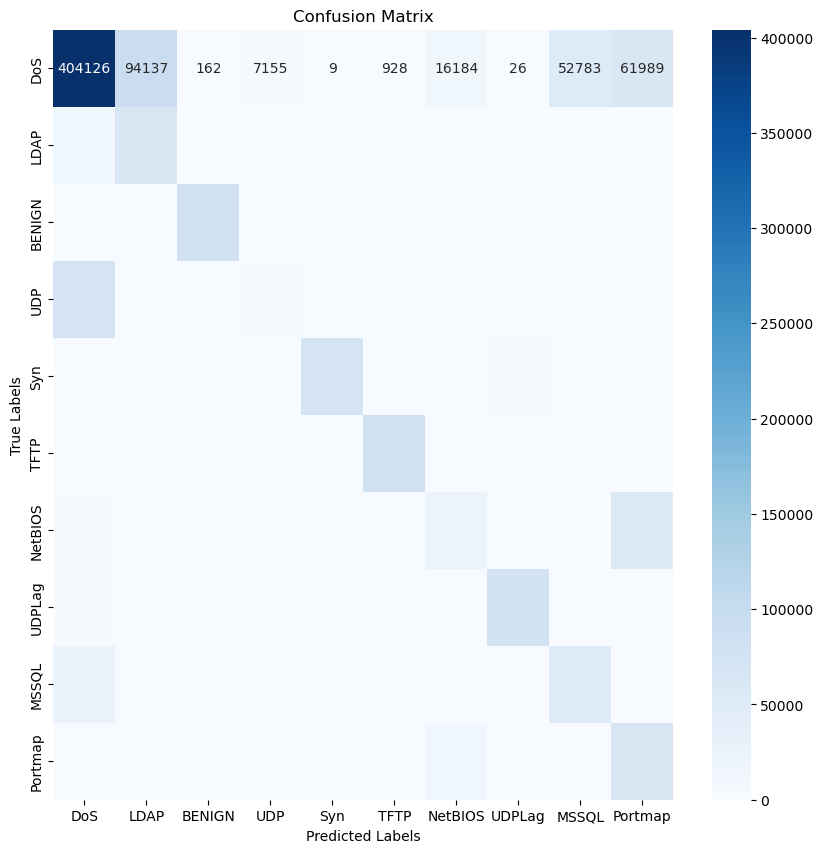

In [16]:
# Celda de evaluación del modelo SIN REDUCIR

# Import necessary libraries
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

# Ensure X_trainArr is a NumPy array of type float64
X_trainArr = X_train.astype(np.float64) if not isinstance(X_train, np.ndarray) else X_train

# Fit the model with training data
model.fit(X_trainArr, Y_train)

# Predict using the model
Y_pred = model.predict(X_trainArr)

# Convert unique labels to a numpy array
LabelsArr = np.array(unique_labels)

# Create a mapping from label names to indices
label_to_index = {label: index for index, label in enumerate(LabelsArr)}

# Map the labels in Y_train and Y_pred using the mapping dictionary
Y_train_mapped = [mapping.get(label, label) for label in Y_train]
Y_pred_mapped = [mapping.get(label, label) for label in Y_pred]

# Convert string labels in Y_train_mapped and Y_pred_mapped to integer indices
Y_train_indices = np.array([label_to_index[label] for label in Y_train_mapped])
Y_pred_indices = np.array([label_to_index[label] for label in Y_pred_mapped])

# Map the numeric predictions to their corresponding label names
y_train_text = [LabelsArr[i] for i in Y_train_indices]
y_pred_text = [LabelsArr[i] for i in Y_pred_indices]

# Compute the confusion matrix
cm = confusion_matrix(y_train_text, y_pred_text, labels=LabelsArr)

# Plot the confusion matrix
plt.figure(figsize=(10, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=LabelsArr, yticklabels=LabelsArr)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

In [17]:
from sklearn.metrics import classification_report

print(classification_report(y_train_text, y_pred_text, digits=8, zero_division=0))

              precision    recall  f1-score   support

      BENIGN  0.99535803 0.99720464 0.99628048     79775
         DoS  0.76811784 0.63392413 0.69459894    637499
        LDAP  0.39865388 0.78723004 0.52927998     79828
       MSSQL  0.47930569 0.62973911 0.54431983     79498
     NetBIOS  0.43036330 0.29927960 0.35304656     79678
     Portmap  0.35218456 0.79458364 0.48804996     79463
         Syn  0.99919774 0.90598741 0.95031244     79734
        TFTP  0.97449042 0.99895901 0.98657302     79732
         UDP  0.45945342 0.07737162 0.13244038     79745
      UDPLag  0.91118917 0.96462356 0.93714530     79601

    accuracy                      0.67801850   1354553
   macro avg  0.67683141 0.70889028 0.66120469   1354553
weighted avg  0.71449515 0.67801850 0.67499232   1354553



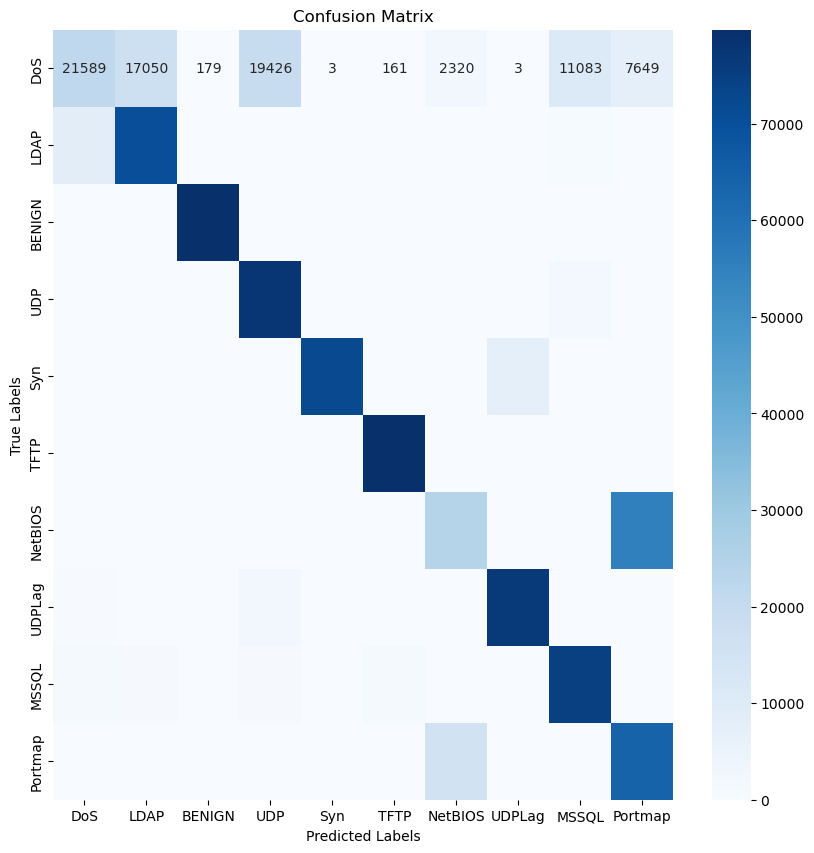

In [18]:
# Celda de evaluación del modelo REDUCIDO

# Import necessary libraries
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

# Separar las características y las etiquetas del dataset reducido
X_train_reduced = reduced_dataset.drop(columns=['Label'])
Y_train_reduced = reduced_dataset['Label']

# Convert data to numpy arrays if not already
X_trainArr = X_train_reduced.to_numpy()
X_trainArr = X_trainArr.astype(np.float64)

# Fit the model with training data
model.fit(X_trainArr, Y_train_reduced)

# Predict using the model
Y_pred = model.predict(X_trainArr)

# Convert unique labels to a numpy array
LabelsArr = np.array(unique_labels)

# Create a mapping from label names to indices
label_to_index = {label: index for index, label in enumerate(LabelsArr)}

# Map the labels in Y_train_reduced and Y_pred using the mapping dictionary
Y_train_mapped = [mapping.get(label, label) for label in Y_train_reduced]
Y_pred_mapped = [mapping.get(label, label) for label in Y_pred]

# Convert string labels in Y_train_mapped and Y_pred_mapped to integer indices
Y_train_indices = np.array([label_to_index[label] for label in Y_train_mapped])
Y_pred_indices = np.array([label_to_index[label] for label in Y_pred_mapped])

# Map the numeric predictions to their corresponding label names
y_train_text = [LabelsArr[i] for i in Y_train_indices]
y_pred_text = [LabelsArr[i] for i in Y_pred_indices]

# Compute the confusion matrix
cm = confusion_matrix(y_train_text, y_pred_text, labels=LabelsArr)

# Plot the confusion matrix
plt.figure(figsize=(10, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=LabelsArr, yticklabels=LabelsArr)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

In [19]:
#DATASET DOS BALANCEADO
from sklearn.metrics import classification_report

print(classification_report(y_train_text, y_pred_text, digits=8, zero_division=0))

              precision    recall  f1-score   support

      BENIGN  0.99605237 0.99946098 0.99775377     79775
         DoS  0.66743956 0.27168619 0.38617643     79463
        LDAP  0.79546864 0.88358721 0.83721565     79828
       MSSQL  0.84580317 0.94051423 0.89064789     79498
     NetBIOS  0.57896745 0.30471397 0.39928297     79678
     Portmap  0.50387340 0.80379548 0.61943993     79463
         Syn  0.99952963 0.90613791 0.95054533     79734
        TFTP  0.98099566 0.99895901 0.98989585     79732
         UDP  0.77309772 0.97543420 0.86255898     79745
      UDPLag  0.91158634 0.96497531 0.93752136     79601

    accuracy                      0.80509769    796517
   macro avg  0.80528139 0.80492645 0.78710382    796517
weighted avg  0.80542477 0.80509769 0.78728603    796517



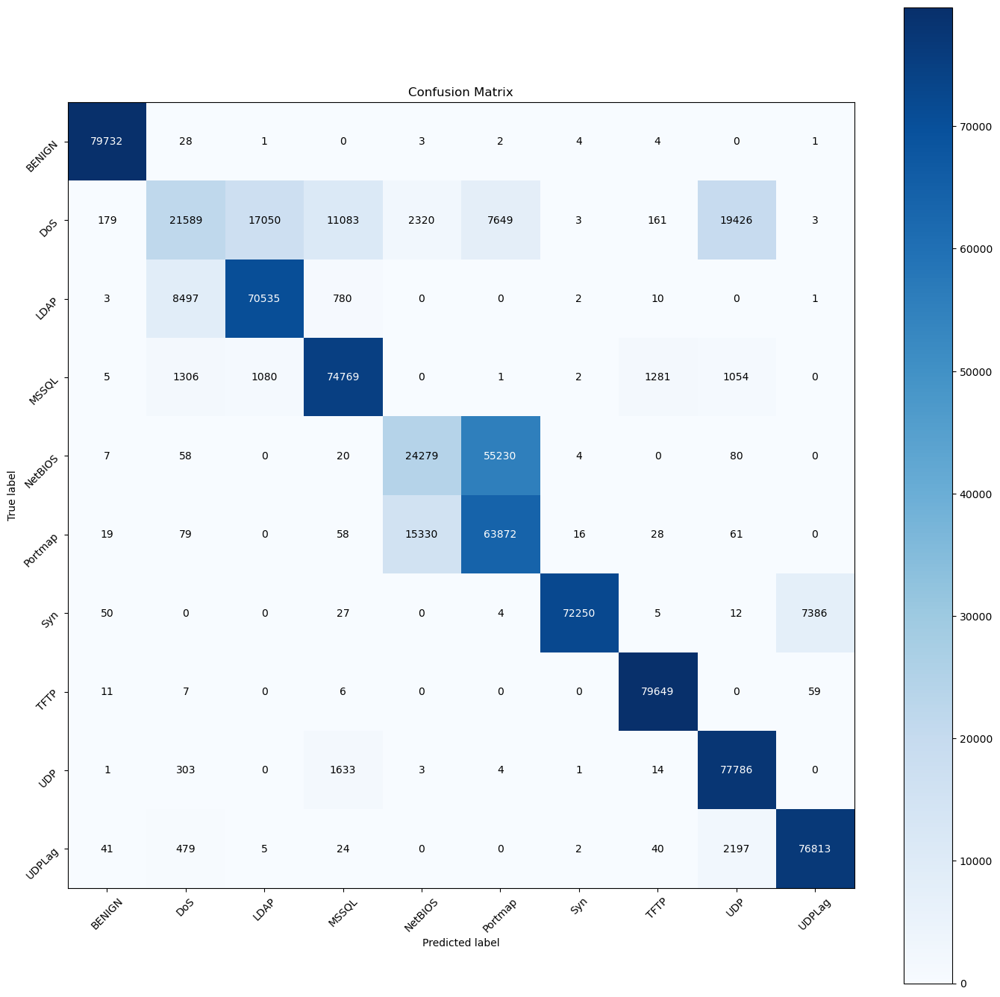

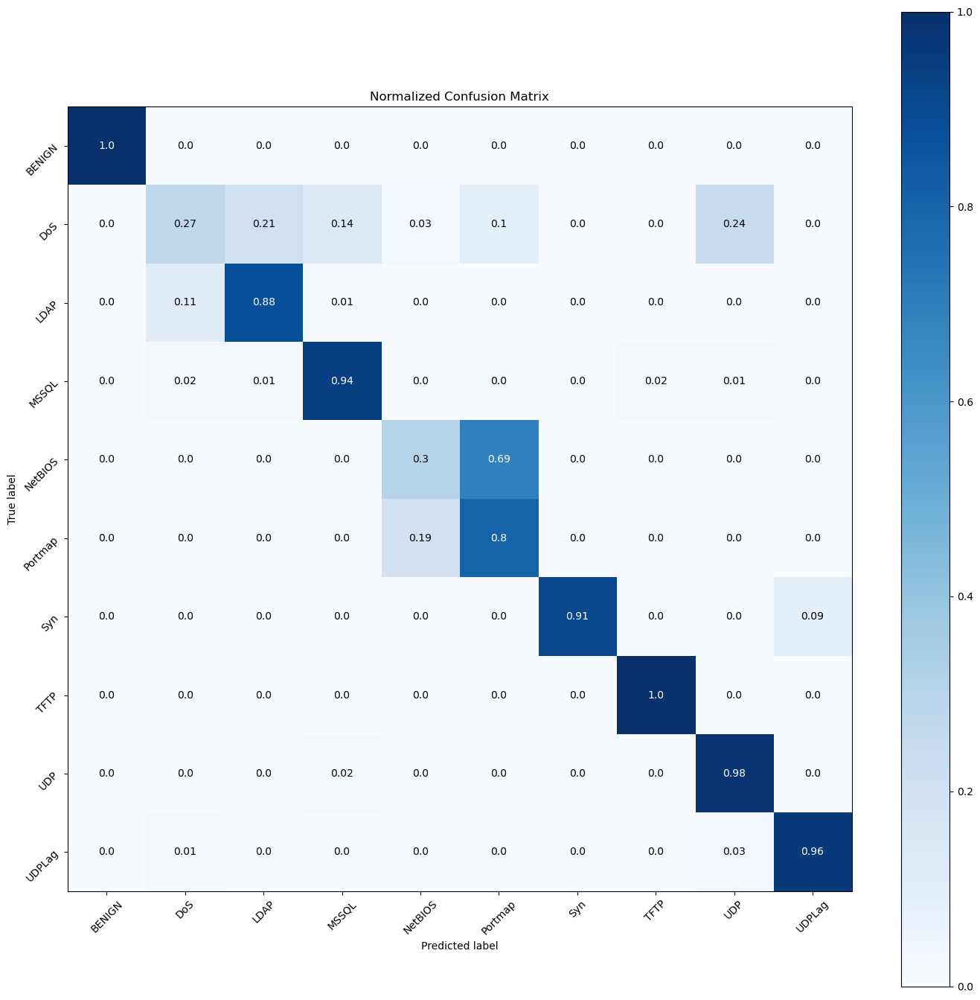

In [20]:
import scikitplot as skplt

skplt.metrics.plot_confusion_matrix(y_train_text, y_pred_text, figsize= (17,17))
# Rotate x-axis and y-axis labels by 45 degrees
plt.xticks(rotation=45)
plt.yticks(rotation=45)
plt.show()
skplt.metrics.plot_confusion_matrix(y_train_text, y_pred_text, normalize= True, figsize= (17,17))
# Rotate x-axis and y-axis labels by 45 degrees
plt.xticks(rotation=45)
plt.yticks(rotation=45)
plt.show()

In [21]:
model_reduce = Pipeline([
    ('variance_threshold', VarianceThreshold(threshold=0.0)),
    ('scaler', StandardScaler()),
    ('classifier', MLPClassifier(hidden_layer_sizes=(16,12), activation='relu', max_iter=1200, random_state=0))
])
model_reduce.fit(X_train_reduced, Y_train_reduced)

Pipeline(steps=[('variance_threshold', VarianceThreshold()),
                ('scaler', StandardScaler()),
                ('classifier',
                 MLPClassifier(hidden_layer_sizes=(16, 12), max_iter=1200,
                               random_state=0))])

In [22]:
#PARA EVITAR PROBLEMAS REDUCIMOS EL DATASET POST ENTRENAMIENTO PARA REPRODUCCION DE LOS RESULTADOS

# Paso 1: Total de muestras en el dataset original
total_samples = reduced_dataset.shape[0]  # total_samples = 796,517

# Paso 2: Proporción de cada clase en el dataset original
class_counts = reduced_dataset['Label'].value_counts()
class_proportions = class_counts / total_samples

# Paso 3: Número de muestras objetivo por clase
target_total_samples = 420910
target_class_counts = (class_proportions * target_total_samples).round().astype(int)

# Ajustar para que la suma total sea exactamente 420,910
difference = target_total_samples - target_class_counts.sum()
if difference != 0:
    # Ajustar la clase con mayor número de muestras
    max_class = target_class_counts.idxmax()
    target_class_counts[max_class] += difference

# Paso 4: Muestrear cada clase
sampled_dfs = []

for label in class_counts.index:
    class_data = reduced_dataset[reduced_dataset['Label'] == label]
    n_samples = target_class_counts[label]
    # Asegurarse de no pedir más muestras de las disponibles
    n_samples = min(n_samples, len(class_data))
    # Muestrear sin reemplazo
    sampled_class_data = class_data.sample(n=n_samples, random_state=42)
    sampled_dfs.append(sampled_class_data)

# Paso 5: Combinar los DataFrames muestreados
reduced_proportional_dataset = pd.concat(sampled_dfs, ignore_index=True)

# Paso 6: Verificar el nuevo conteo de clases y tamaño total
new_class_counts = reduced_proportional_dataset['Label'].value_counts()
print("Conteo de clases en el dataset reducido:")
print(new_class_counts)
print("Tamaño total del dataset reducido:", reduced_proportional_dataset.shape[0])

Conteo de clases en el dataset reducido:
Label
LDAP       42186
BENIGN     42156
UDP        42140
Syn        42134
TFTP       42133
NetBIOS    42105
UDPLag     42064
MSSQL      42010
DoS        41991
Portmap    41991
Name: count, dtype: int64
Tamaño total del dataset reducido: 420910


In [23]:
# Separar las características y las etiquetas del dataset reducido
X_test_reduced = reduced_proportional_dataset.drop(columns=['Label'])
Y_test_reduced = reduced_proportional_dataset['Label']

# Convert data to numpy arrays if not already
X_testArr = X_test_reduced.to_numpy()
X_testArr = X_testArr.astype(np.float64)
#print((X_test.shape))
#print((X_testArr.shape))
#print((X_train_reduced.shape))
#print((Y_train_reduced.shape))
#print((reduced_dataset.shape))

# Fit the model with training data
#model_reduce.fit(X_train_reduced, Y_train_reduced)

# Predict using the model
Y_pred = model_reduce.predict(X_testArr)

# Convert unique labels to a numpy array
LabelsArr1 = np.array(unique_labels) #ERROR

# Create a mapping from label names to indices
label_to_index = {label: index for index, label in enumerate(LabelsArr1)}

# Map the labels in Y_test_reduced and Y_pred using the mapping dictionary
Y_test_mapped = [mapping.get(label, label) for label in Y_test]
Y_pred_mapped = [mapping.get(label, label) for label in Y_pred]
print(Y_test.shape)
print(X_testArr.shape)
print(len(Y_test_mapped))
print(len(Y_pred_mapped))
print(label_to_index)
print (reduced_dataset.shape)
print(dataset1.shape)

# Convert string labels in Y_test_mapped and Y_pred_mapped to integer indices
#Y_test_indices = np.array([label_to_index[label] for label in Y_test_mapped])
Y_pred_indices = np.array([label_to_index[label] for label in Y_pred_mapped])

Y_test_indices = Y_test_mapped
#Y_pred_indices = Y_pred_mapped

# Map the numeric predictions to their corresponding label names
y_test_text = [LabelsArr1[i] for i in Y_test_indices]
y_pred_text = [LabelsArr1[i] for i in Y_pred_indices]



print(classification_report(y_test_text, y_pred_text, digits=8, zero_division= "warn"))

from collections import Counter

print("Distribución de clases en y_test_text:")
print(Counter(y_test_text))

print("\nDistribución de clases en y_pred_text:")
print(Counter(y_pred_text))

print("Clases en Y_train:", set(np.unique(Y_train)))
print("Clases en Y_test:", set(np.unique(Y_test)))

"""
# Aplanar Y_pred si es un arreglo 2D
Y_pred = Y_pred.flatten() if isinstance(Y_pred, np.ndarray) and len(Y_pred.shape) == 2 else Y_pred

# Asegurarse de que Y_pred es un arreglo de NumPy
Y_pred = np.array(Y_pred)

# Convertir LabelsArr a lista si es un arreglo de NumPy
LabelsArr = LabelsArr.tolist() if isinstance(LabelsArr, np.ndarray) else LabelsArr

# Crear un diccionario para mapear índices a etiquetas
index_to_label = {index: label for index, label in enumerate(LabelsArr)}

# Mapear las etiquetas numéricas de Y_test y Y_pred a etiquetas de texto
y_test1_text = [index_to_label[int(label)] for label in Y_test]
y_pred_text = [label for label in Y_pred]
print(Y_train)

# Predict using the model
Y_pred_reduce = model_reduce.predict(X_test)
"""

c:\Users\ecaba\anaconda3\envs\tfm2025\lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but VarianceThreshold was fitted with feature names
  warnings.warn(


(420910,)
(420910, 64)
420910
420910
{'DoS': 0, 'LDAP': 1, 'BENIGN': 2, 'UDP': 3, 'Syn': 4, 'TFTP': 5, 'NetBIOS': 6, 'UDPLag': 7, 'MSSQL': 8, 'Portmap': 9}
(796517, 65)
(420910, 77)


c:\Users\ecaba\anaconda3\envs\tfm2025\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ecaba\anaconda3\envs\tfm2025\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ecaba\anaconda3\envs\tfm2025\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

      BENIGN  0.33049666 0.09985145 0.15336686    140018
         DoS  0.00205146 0.03854626 0.00389560       908
        LDAP  0.16463272 0.11036866 0.13214692     70038
       MSSQL  0.00000000 0.00000000 0.00000000         0
     NetBIOS  0.00000000 0.00000000 0.00000000         0
     Portmap  0.00000000 0.00000000 0.00000000         0
         Syn  0.16394901 0.08953944 0.11582305     69958
        TFTP  0.00000000 0.00000000 0.00000000         0
         UDP  0.33291410 0.12668943 0.18353513    139988
      UDPLag  0.00000000 0.00000000 0.00000000         0

    accuracy                      0.10868119    420910
   macro avg  0.09940440 0.04649952 0.05887676    420910
weighted avg  0.27531162 0.10868119 0.15330695    420910

Distribución de clases en y_test_text:
Counter({'BENIGN': 140018, 'UDP': 139988, 'LDAP': 70038, 'Syn': 69958, 'DoS': 908})

Distribución de clases en y_pred_text:
Counter({'Portmap': 66963, 'UDP': 53272, 

'\n# Aplanar Y_pred si es un arreglo 2D\nY_pred = Y_pred.flatten() if isinstance(Y_pred, np.ndarray) and len(Y_pred.shape) == 2 else Y_pred\n\n# Asegurarse de que Y_pred es un arreglo de NumPy\nY_pred = np.array(Y_pred)\n\n# Convertir LabelsArr a lista si es un arreglo de NumPy\nLabelsArr = LabelsArr.tolist() if isinstance(LabelsArr, np.ndarray) else LabelsArr\n\n# Crear un diccionario para mapear índices a etiquetas\nindex_to_label = {index: label for index, label in enumerate(LabelsArr)}\n\n# Mapear las etiquetas numéricas de Y_test y Y_pred a etiquetas de texto\ny_test1_text = [index_to_label[int(label)] for label in Y_test]\ny_pred_text = [label for label in Y_pred]\nprint(Y_train)\n\n# Predict using the model\nY_pred_reduce = model_reduce.predict(X_test)\n'

In [24]:
print(classification_report(y_test_text, y_pred_text, digits=8, zero_division= "warn"))

c:\Users\ecaba\anaconda3\envs\tfm2025\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ecaba\anaconda3\envs\tfm2025\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

      BENIGN  0.33049666 0.09985145 0.15336686    140018
         DoS  0.00205146 0.03854626 0.00389560       908
        LDAP  0.16463272 0.11036866 0.13214692     70038
       MSSQL  0.00000000 0.00000000 0.00000000         0
     NetBIOS  0.00000000 0.00000000 0.00000000         0
     Portmap  0.00000000 0.00000000 0.00000000         0
         Syn  0.16394901 0.08953944 0.11582305     69958
        TFTP  0.00000000 0.00000000 0.00000000         0
         UDP  0.33291410 0.12668943 0.18353513    139988
      UDPLag  0.00000000 0.00000000 0.00000000         0

    accuracy                      0.10868119    420910
   macro avg  0.09940440 0.04649952 0.05887676    420910
weighted avg  0.27531162 0.10868119 0.15330695    420910



c:\Users\ecaba\anaconda3\envs\tfm2025\lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [25]:

#expected_value = explainer.expected_value

# Calculate SHAP values
#size=200
#data=shap.sample(X_trainArr, size)
#explainer = shap.KernelExplainer(model.predict_proba,data)
#expected_value = explainer.expected_value
#data1=shap.sample(X_testArr, size)
#shap_values = explainer.shap_values(data1, nsamples=size)


# Calculate SHAP values
size = 200
data = shap.sample(X_trainArr, size)
explainer = shap.KernelExplainer(model.predict_proba, data)
expected_value = explainer.expected_value

# Asegúrate de que X_test es un numpy array
X_testArr = X_test.to_numpy()

data1 = shap.sample(X_testArr, size)
shap_values = explainer.shap_values(data1, nsamples=size)

Using 200 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  0%|          | 0/200 [00:00<?, ?it/s]

Shape of shap_values: (200, 64, 10)
Shape of data1: (200, 64)
Number of features: 64
Shape of shap_values_mean: (200, 64)


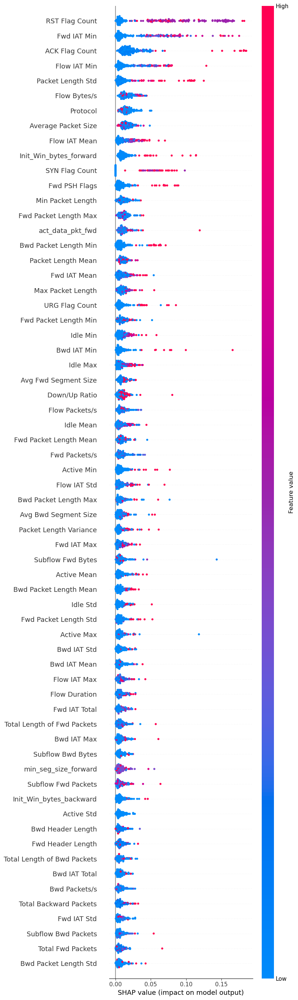

Plotting SHAP values for class 0


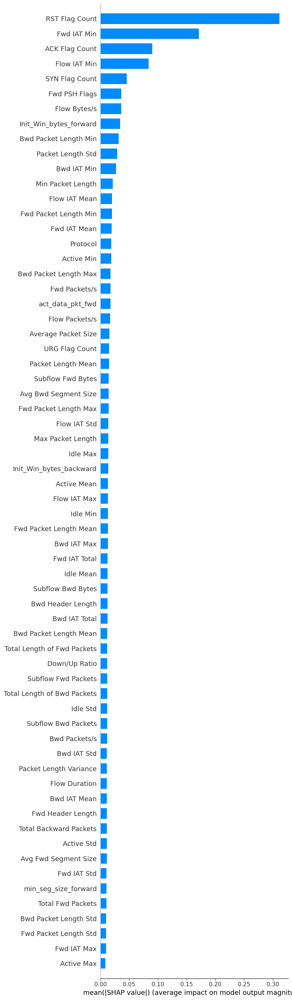

<Figure size 640x480 with 0 Axes>

Plotting SHAP values for class 1


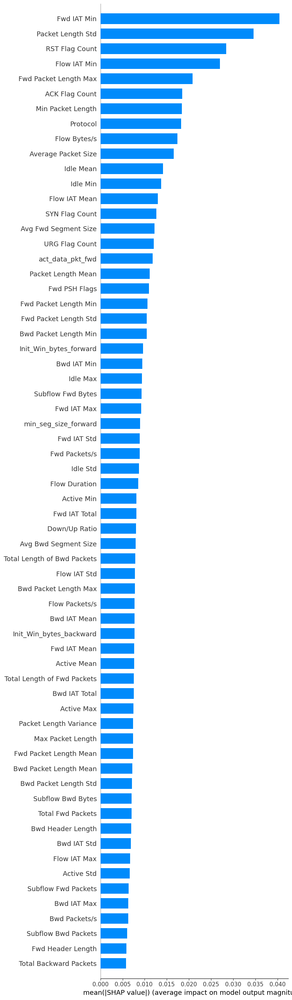

<Figure size 640x480 with 0 Axes>

Plotting SHAP values for class 2


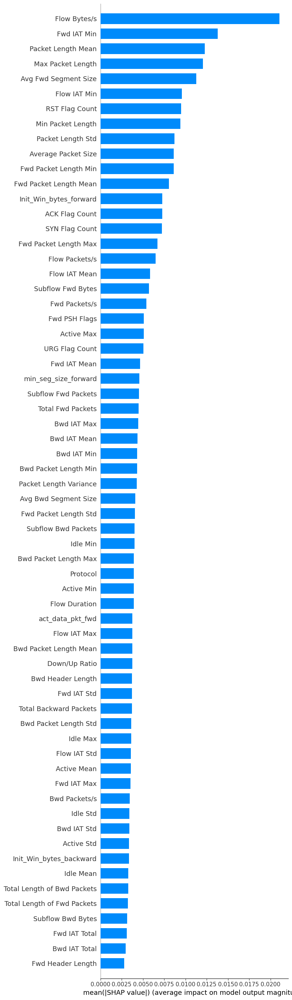

<Figure size 640x480 with 0 Axes>

Plotting SHAP values for class 3


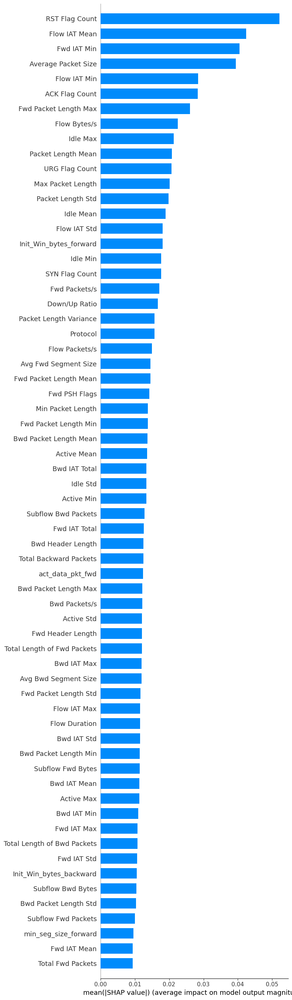

<Figure size 640x480 with 0 Axes>

Plotting SHAP values for class 4


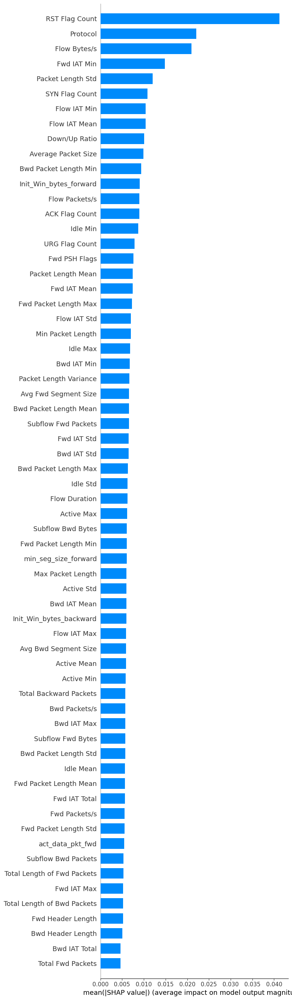

<Figure size 640x480 with 0 Axes>

Plotting SHAP values for class 5


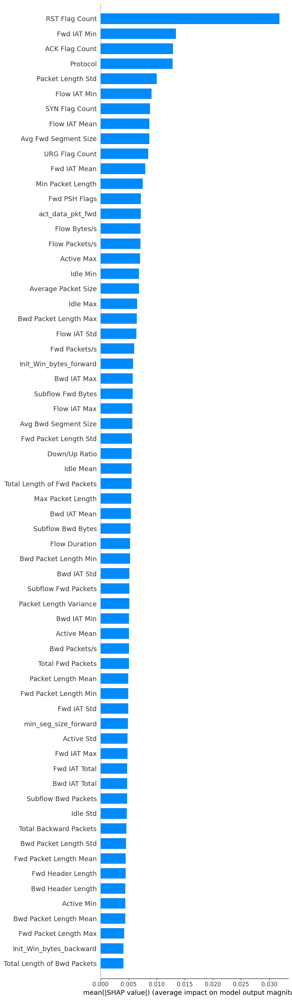

<Figure size 640x480 with 0 Axes>

Plotting SHAP values for class 6


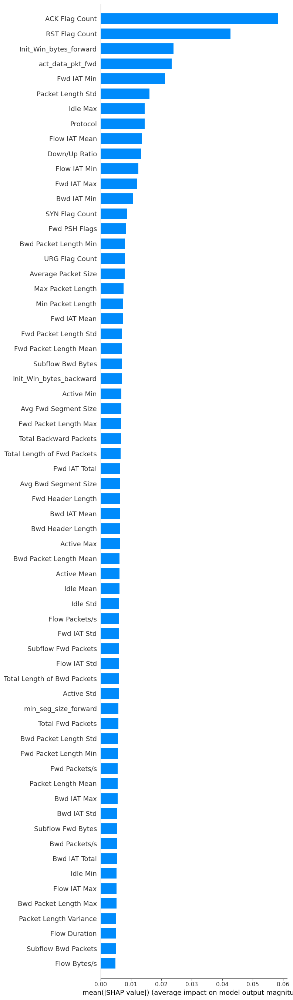

<Figure size 640x480 with 0 Axes>

Plotting SHAP values for class 7


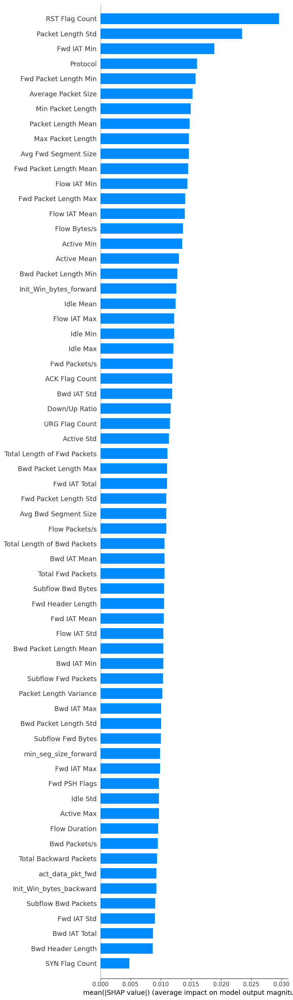

<Figure size 640x480 with 0 Axes>

Plotting SHAP values for class 8


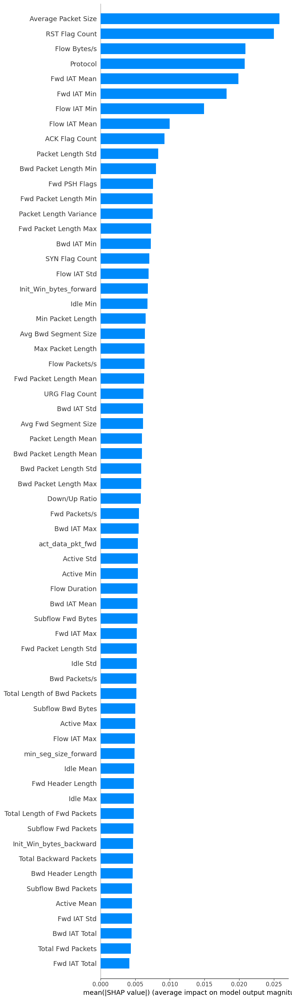

<Figure size 640x480 with 0 Axes>

Plotting SHAP values for class 9


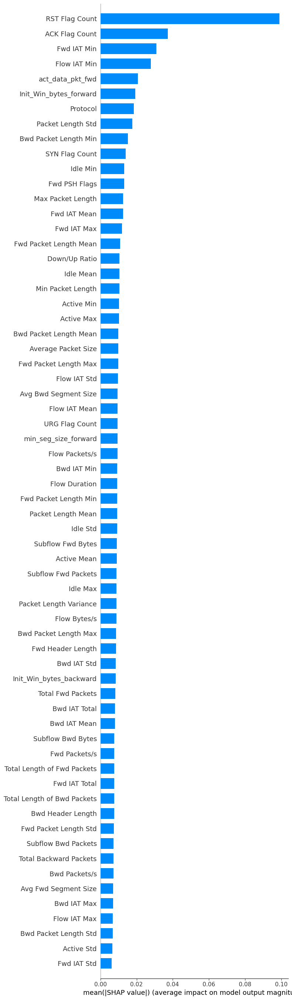

<Figure size 640x480 with 0 Axes>

In [26]:
#np.savetxt('testV3.1.txt',shap_values)


#shap_values = np.loadtxt('testV3.1.txt')
#print(shap_values.shape)

# Save SHAP values to a file
np.save('test1.npy', shap_values)

# Load SHAP values from the file
shap_values = np.load('test1.npy', allow_pickle=True)

# Inspect the shape of shap_values and data1
print(f"Shape of shap_values: {shap_values.shape}")
print(f"Shape of data1: {data1.shape}")

# Verify the number of features
print(f"Number of features: {len(features)}")

# Calculate the mean absolute SHAP values across all classes
shap_values_mean = np.abs(shap_values).mean(axis=2)

print(f"Shape of shap_values_mean: {shap_values_mean.shape}")

# Plot the mean SHAP values
shap.summary_plot(shap_values_mean, data1, feature_names=features, max_display=75)

# If you want to see SHAP values for each class individually:
for i in range(shap_values.shape[2]):
    print(f"Plotting SHAP values for class {i}")
    plt.figure(figsize=(10, 8))
    shap.summary_plot(
        shap_values[:, :, i], 
        data1, 
        feature_names=features, 
        max_display=75, 
        plot_type="bar", 
        title=f"SHAP values for class {i}"
    )
    plt.tight_layout()
    plt.show()


    

In [27]:
#shap.summary_plot(shap_values, data1, plot_type="bar", class_names= Labels1, feature_names = features)

C:\Users\ecaba\AppData\Local\Temp\ipykernel_28440\126949799.py:7: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  pos = int(pos[0])


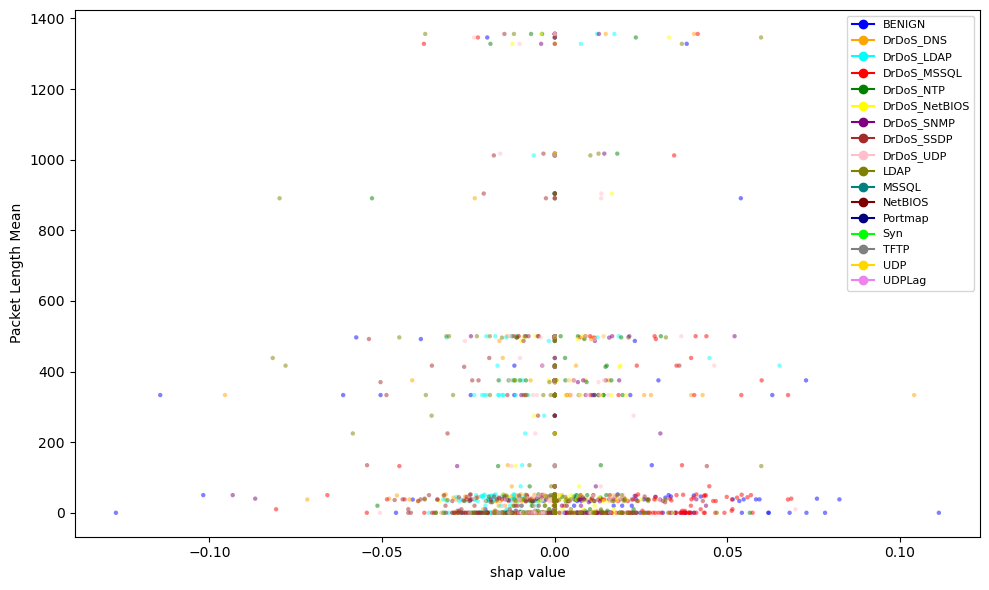

In [28]:
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

caracteristica = "Packet Length Mean"
pos = np.char.find(features, caracteristica, start=0, end=None)
pos = np.where(pos == 0)
pos = int(pos[0])
plt.rcParams["figure.figsize"] = (10, 6)
y_preddata = model.predict(data1)

labels = ["BENIGN", "DrDoS_DNS", "DrDoS_LDAP", "DrDoS_MSSQL", "DrDoS_NTP", "DrDoS_NetBIOS",
          "DrDoS_SNMP", "DrDoS_SSDP", "DrDoS_UDP", "LDAP", "MSSQL", "NetBIOS", "Portmap",
          "Syn", "TFTP", "UDP", "UDPLag"]

colors = ["blue", "orange", "cyan", "red", "green", "yellow", "purple", "brown", "pink", "olive",
          "teal", "maroon", "navy", "lime", "gray", "gold", "violet"]

custom_lines = [Line2D([0], [0], marker='o', color=c, label=l, markersize=6) for c, l in zip(colors, labels)]

fig, ax = plt.subplots(figsize=(10, 6))

for shap_feature, color, label in zip(shap_values.transpose(2, 0, 1), colors, labels):
    x = shap_feature[:, pos]
    y = data1[:, pos]
    col = [color] * len(y_preddata)
    ax.scatter(x, y, c=col, s=10, linewidth=0, label=label, alpha=0.5)

ax.set_xlabel('shap value')
ax.set_ylabel(caracteristica)
ax.legend(handles=custom_lines, loc="best", prop={'size': 8})

plt.tight_layout()
plt.show()

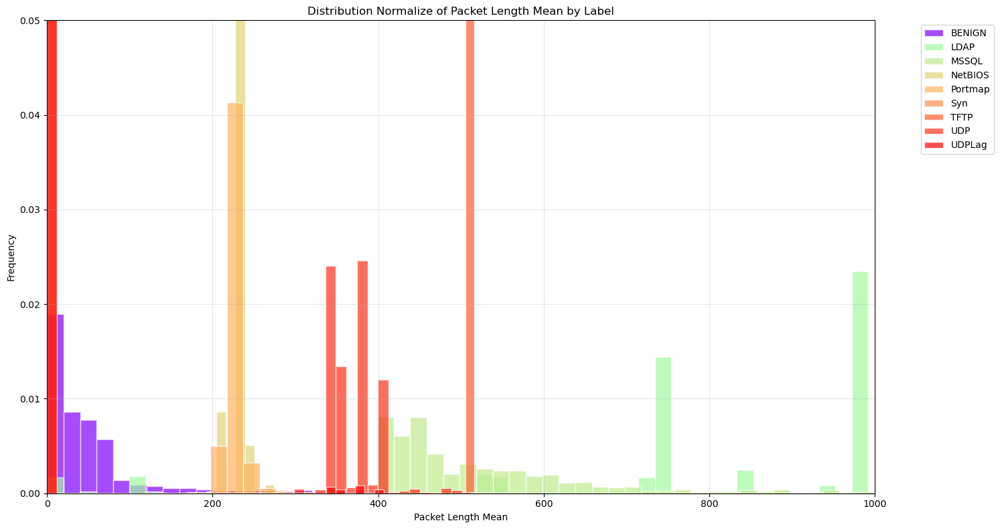

BENIGN: 79775 samples, range: 0.0 - 3657.5288526816
DrDoS_DNS: 0 samples, range: nan - nan
DrDoS_LDAP: 0 samples, range: nan - nan
DrDoS_MSSQL: 0 samples, range: nan - nan
DrDoS_NTP: 0 samples, range: nan - nan
DrDoS_NetBIOS: 0 samples, range: nan - nan
DrDoS_SNMP: 0 samples, range: nan - nan
DrDoS_SSDP: 0 samples, range: nan - nan
DrDoS_UDP: 0 samples, range: nan - nan
LDAP: 79828 samples, range: 0.0 - 1472.0
MSSQL: 79498 samples, range: 0.0 - 1472.0
NetBIOS: 79678 samples, range: 6.0 - 589.0
Portmap: 79463 samples, range: 0.0 - 1000.0
Syn: 79734 samples, range: 0.0 - 557.0
TFTP: 79732 samples, range: 0.0 - 1472.0
UDP: 79745 samples, range: 6.0 - 641.0
UDPLag: 79601 samples, range: 0.0 - 1472.0


In [29]:
import matplotlib.pyplot as plt
import numpy as np

caracteris = 'Packet Length Mean'
plt.rcParams["figure.figsize"] = (15, 8)
lim = 1000
ylim = 0.05 #ylim = 20000 density= False

labels = ["BENIGN", "DrDoS_DNS", "DrDoS_LDAP", "DrDoS_MSSQL", "DrDoS_NTP", "DrDoS_NetBIOS",
          "DrDoS_SNMP", "DrDoS_SSDP", "DrDoS_UDP", "LDAP", "MSSQL", "NetBIOS", "Portmap",
          "Syn", "TFTP", "UDP", "UDPLag"]

colors = plt.cm.rainbow(np.linspace(0, 1, len(labels)))

fig, ax = plt.subplots()

for label, color in zip(labels, colors):
    data = dataset[dataset['Label'] == label][caracteris]
    data = data[data < lim]  # Aplicar el límite
    if not data.empty:
        ax.hist(data, density=True, bins=50, alpha=0.7, label=label, color=color, edgecolor='white')

ax.set_xlim([0, lim])
ax.set_ylim([0, ylim])
ax.set_xlabel(caracteris)
ax.set_ylabel('Frequency')
ax.set_title(f'Distribution Normalize of {caracteris} by Label')

ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Imprimir información sobre los datos
for label in labels:
    data = dataset[dataset['Label'] == label][caracteris]
    print(f"{label}: {len(data)} samples, range: {data.min()} - {data.max()}")

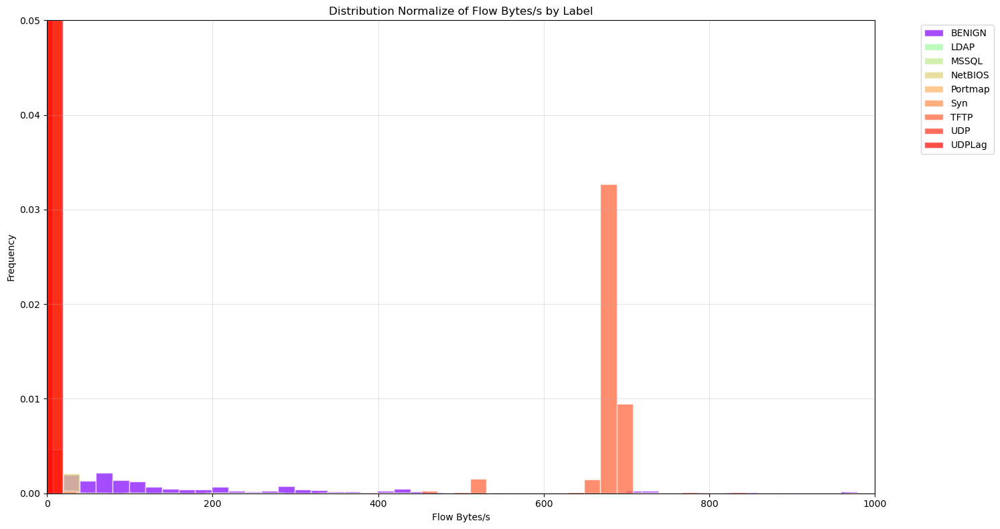

BENIGN: 79775 samples, range: -1.0 - 1947000000.0
DrDoS_DNS: 0 samples, range: nan - nan
DrDoS_LDAP: 0 samples, range: nan - nan
DrDoS_MSSQL: 0 samples, range: nan - nan
DrDoS_NTP: 0 samples, range: nan - nan
DrDoS_NetBIOS: 0 samples, range: nan - nan
DrDoS_SNMP: 0 samples, range: nan - nan
DrDoS_SSDP: 0 samples, range: nan - nan
DrDoS_UDP: 0 samples, range: nan - nan
LDAP: 79828 samples, range: -1.0 - 2944000000.0
MSSQL: 79498 samples, range: -1.0 - 2944000000.0
NetBIOS: 79678 samples, range: -1.0 - 1178000000.0
Portmap: 79463 samples, range: -1.0 - 2000000000.0
Syn: 79734 samples, range: -1.0 - 730000000.0
TFTP: 79732 samples, range: -1.0 - 1472000000.0
UDP: 79745 samples, range: -1.0 - 1318000000.0
UDPLag: 79601 samples, range: -1.0 - 2944000000.0


In [30]:
import matplotlib.pyplot as plt
import numpy as np

caracteris = 'Flow Bytes/s'
plt.rcParams["figure.figsize"] = (15, 8)
lim = 1000
ylim = 0.05 #ylim = 20000 density= False

labels = ["BENIGN", "DrDoS_DNS", "DrDoS_LDAP", "DrDoS_MSSQL", "DrDoS_NTP", "DrDoS_NetBIOS",
          "DrDoS_SNMP", "DrDoS_SSDP", "DrDoS_UDP", "LDAP", "MSSQL", "NetBIOS", "Portmap",
          "Syn", "TFTP", "UDP", "UDPLag"]

colors = plt.cm.rainbow(np.linspace(0, 1, len(labels)))

fig, ax = plt.subplots()

for label, color in zip(labels, colors):
    data = dataset[dataset['Label'] == label][caracteris]
    data = data[data < lim]  # Aplicar el límite
    if not data.empty:
        ax.hist(data, density=True, bins=50, alpha=0.7, label=label, color=color, edgecolor='white')

ax.set_xlim([0, lim])
ax.set_ylim([0, ylim])
ax.set_xlabel(caracteris)
ax.set_ylabel('Frequency')
ax.set_title(f'Distribution Normalize of {caracteris} by Label')
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Imprimir información sobre los datos
for label in labels:
    data = dataset[dataset['Label'] == label][caracteris]
    print(f"{label}: {len(data)} samples, range: {data.min()} - {data.max()}")

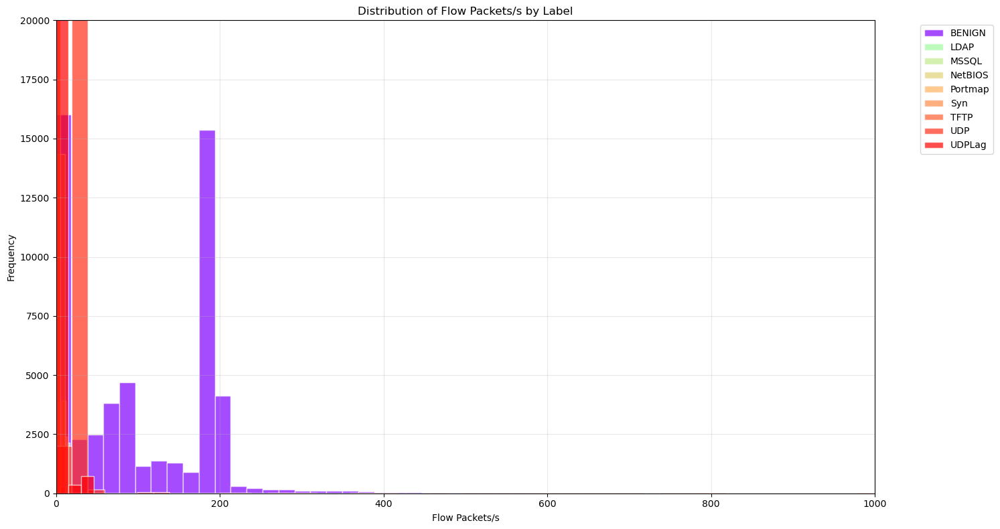

BENIGN: 79775 samples, range: -1.0 - 3000000.0
DrDoS_DNS: 0 samples, range: nan - nan
DrDoS_LDAP: 0 samples, range: nan - nan
DrDoS_MSSQL: 0 samples, range: nan - nan
DrDoS_NTP: 0 samples, range: nan - nan
DrDoS_NetBIOS: 0 samples, range: nan - nan
DrDoS_SNMP: 0 samples, range: nan - nan
DrDoS_SSDP: 0 samples, range: nan - nan
DrDoS_UDP: 0 samples, range: nan - nan
LDAP: 79828 samples, range: -1.0 - 2000000.0
MSSQL: 79498 samples, range: -1.0 - 2000000.0
NetBIOS: 79678 samples, range: -1.0 - 2000000.0
Portmap: 79463 samples, range: -1.0 - 2000000.0
Syn: 79734 samples, range: -1.0 - 2000000.0
TFTP: 79732 samples, range: -1.0 - 2000000.0
UDP: 79745 samples, range: -1.0 - 3000000.0
UDPLag: 79601 samples, range: -1.0 - 2000000.0


In [31]:
import matplotlib.pyplot as plt
import numpy as np

caracteris = 'Flow Packets/s'
plt.rcParams["figure.figsize"] = (15, 8)
lim = 1000
ylim = 20000

labels = ["BENIGN", "DrDoS_DNS", "DrDoS_LDAP", "DrDoS_MSSQL", "DrDoS_NTP", "DrDoS_NetBIOS",
          "DrDoS_SNMP", "DrDoS_SSDP", "DrDoS_UDP", "LDAP", "MSSQL", "NetBIOS", "Portmap",
          "Syn", "TFTP", "UDP", "UDPLag"]

colors = plt.cm.rainbow(np.linspace(0, 1, len(labels)))

fig, ax = plt.subplots()

for label, color in zip(labels, colors):
    data = dataset[dataset['Label'] == label][caracteris]
    data = data[data < lim]  # Aplicar el límite
    if not data.empty:
        ax.hist(data, bins=50, alpha=0.7, label=label, color=color, edgecolor='white')

ax.set_xlim([0, lim])
ax.set_ylim([0, ylim])
ax.set_xlabel(caracteris)
ax.set_ylabel('Frequency')
ax.set_title(f'Distribution of {caracteris} by Label')
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Imprimir información sobre los datos
for label in labels:
    data = dataset[dataset['Label'] == label][caracteris]
    print(f"{label}: {len(data)} samples, range: {data.min()} - {data.max()}")

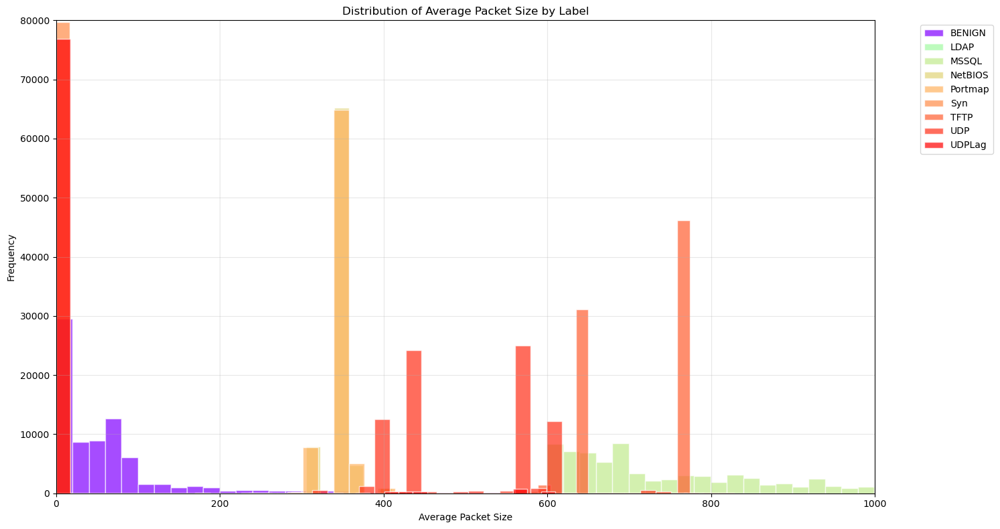

BENIGN: 79775 samples, range: 0.0 - 3660.0135869565215
DrDoS_DNS: 0 samples, range: nan - nan
DrDoS_LDAP: 0 samples, range: nan - nan
DrDoS_MSSQL: 0 samples, range: nan - nan
DrDoS_NTP: 0 samples, range: nan - nan
DrDoS_NetBIOS: 0 samples, range: nan - nan
DrDoS_SNMP: 0 samples, range: nan - nan
DrDoS_SSDP: 0 samples, range: nan - nan
DrDoS_UDP: 0 samples, range: nan - nan
LDAP: 79828 samples, range: 0.0 - 2208.0
MSSQL: 79498 samples, range: 0.0 - 2208.0
NetBIOS: 79678 samples, range: 7.0 - 883.5
Portmap: 79463 samples, range: 0.0 - 1500.0
Syn: 79734 samples, range: 0.0 - 835.5
TFTP: 79732 samples, range: 0.0 - 2208.0
UDP: 79745 samples, range: 7.0 - 961.5
UDPLag: 79601 samples, range: 0.0 - 2208.0


In [32]:
import matplotlib.pyplot as plt
import numpy as np

caracteris = 'Average Packet Size'
plt.rcParams["figure.figsize"] = (15, 8)
lim = 1000
ylim = 80000 

labels = ["BENIGN", "DrDoS_DNS", "DrDoS_LDAP", "DrDoS_MSSQL", "DrDoS_NTP", "DrDoS_NetBIOS",
          "DrDoS_SNMP", "DrDoS_SSDP", "DrDoS_UDP", "LDAP", "MSSQL", "NetBIOS", "Portmap",
          "Syn", "TFTP", "UDP", "UDPLag"]

colors = plt.cm.rainbow(np.linspace(0, 1, len(labels)))

fig, ax = plt.subplots()

for label, color in zip(labels, colors):
    data = dataset[dataset['Label'] == label][caracteris]
    data = data[data < lim]  # Aplicar el límite
    if not data.empty:
        ax.hist(data, bins=50, alpha=0.7, label=label, color=color, edgecolor='white')

ax.set_xlim([0, lim])
ax.set_ylim([0, ylim])
ax.set_xlabel(caracteris)
ax.set_ylabel('Frequency')
ax.set_title(f'Distribution of {caracteris} by Label')
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Imprimir información sobre los datos
for label in labels:
    data = dataset[dataset['Label'] == label][caracteris]
    print(f"{label}: {len(data)} samples, range: {data.min()} - {data.max()}")

C:\Users\ecaba\AppData\Local\Temp\ipykernel_28440\1448262575.py:22: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  ax.set_yscale('log')


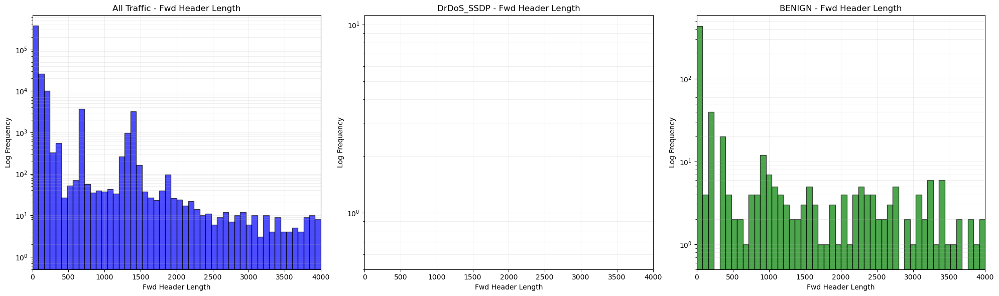

Total samples: 419932
DrDoS_SSDP samples: 0
BENIGN samples: 631

Types of traffic in the dataset:
Label
DoS                      140018
Information Gathering    139988
Mirai                     69888
Bruteforce                69407
BENIGN                      631
Name: count, dtype: int64


In [33]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

caracteris = 'Fwd Header Length'
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(20, 6))
lim = 4000

pruebadf = dataset1[dataset1[caracteris] < lim]
DrDoS_SSDP_df = pruebadf[pruebadf['Label'] == 'DrDoS_SSDP']
Benigndf = pruebadf[pruebadf['Label'] == "BENIGN"]

bin = 50

# Función para crear histograma
def plot_histogram(ax, data, title, color):
    counts, bins, _ = ax.hist(data, bins=bin, range=(0, lim), color=color, edgecolor='black', alpha=0.7)
    ax.set_title(title)
    ax.set_xlim([0, lim])
    ax.set_xlabel(caracteris)
    ax.set_ylabel('Log Frequency')
    ax.set_yscale('log')
    ax.grid(True, which="both", ls="-", alpha=0.2)
    # Añadir valor 1 a las barras vacías para que aparezcan en la escala logarítmica
    counts[counts == 0] = 1
    ax.set_ylim(bottom=0.5)  # Ajustar el límite inferior para mostrar las barras con valor 1

# Histograma para todo el tráfico
plot_histogram(ax[0], pruebadf[caracteris], f'All Traffic - {caracteris}', 'blue')

# Histograma para DrDoS_SSDP (aunque esté vacío)
plot_histogram(ax[1], DrDoS_SSDP_df[caracteris], f'DrDoS_SSDP - {caracteris}', 'red')

# Histograma para tráfico BENIGN
plot_histogram(ax[2], Benigndf[caracteris], f'BENIGN - {caracteris}', 'green')

plt.tight_layout()
plt.show()

# Imprimir estadísticas
print(f"Total samples: {len(pruebadf)}")
print(f"DrDoS_SSDP samples: {len(DrDoS_SSDP_df)}")
print(f"BENIGN samples: {len(Benigndf)}")

# Mostrar tipos de tráfico presentes
print("\nTypes of traffic in the dataset:")
traffic_types = pruebadf['Label'].value_counts()
print(traffic_types)

In [34]:
#print(shap_values.shape)
#print(explainer.expected_value)
#print(len(features))
#print(len(Labels))

import numpy as np

shap.initjs()

# Selecciona una clase específica para visualizar (por ejemplo, la primera clase)
class_index = 0

# Extrae los valores SHAP para la clase seleccionada
shap_values_class = shap_values[:, :, class_index]

# Asegúrate de que data1 sea un array de numpy si no lo es ya
data1_np = np.array(data1)

# Crea el force plot
shap.plots.force(
    base_value=explainer.expected_value[class_index],
    shap_values=shap_values_class,
    features=data1_np,
    feature_names=features,
    out_names=Labels[class_index]  # Usa solo el nombre de la clase seleccionada
)


In [35]:
y_preddata=model.predict(data1)


In [36]:
num=25;
# Selecciona una clase específica para visualizar (por ejemplo, la primera clase)
class_index = 0

# Extrae los valores SHAP para la clase seleccionada
shap_values_class = shap_values[:, :, class_index]

# Asegúrate de que data1 sea un array de numpy si no lo es ya
data1_np = np.array(data1)

# Crea el force plot
shap.plots.force(
    base_value=explainer.expected_value[class_index],
    shap_values=shap_values_class[num,:],
    features=data1_np[num,:],
    feature_names=features,
    out_names=Labels[class_index]  # Usa solo el nombre de la clase seleccionada
)

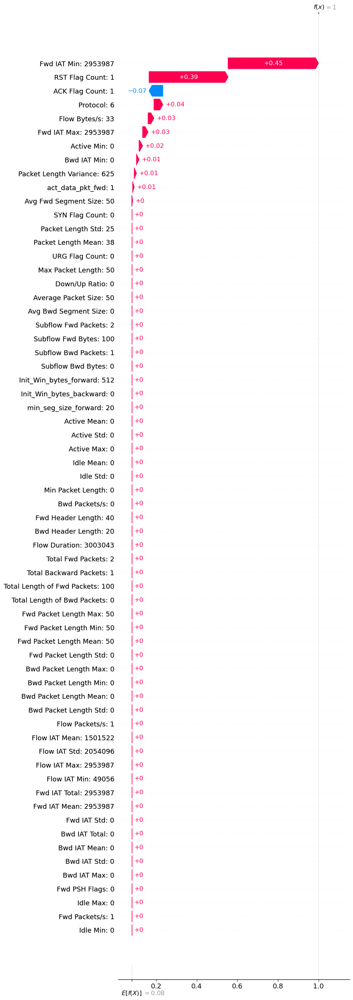

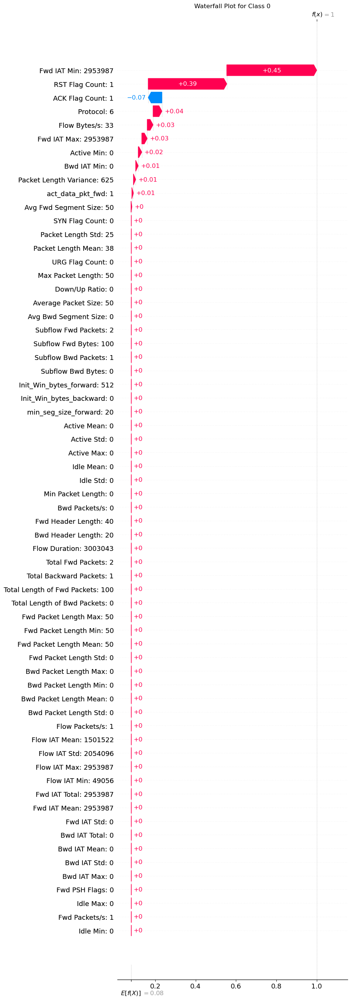

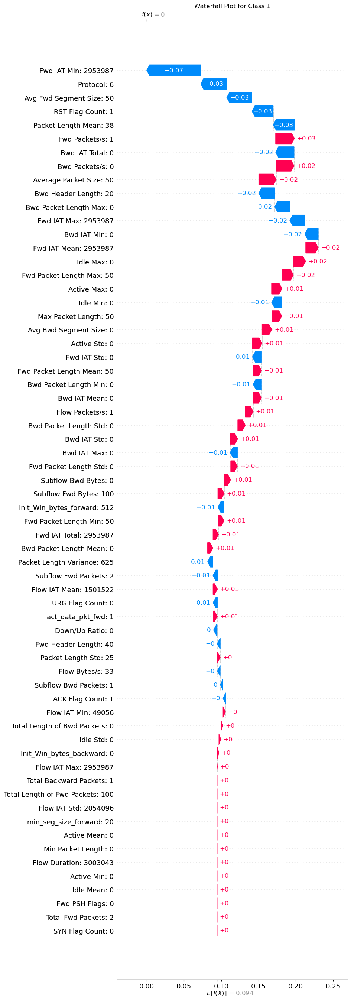

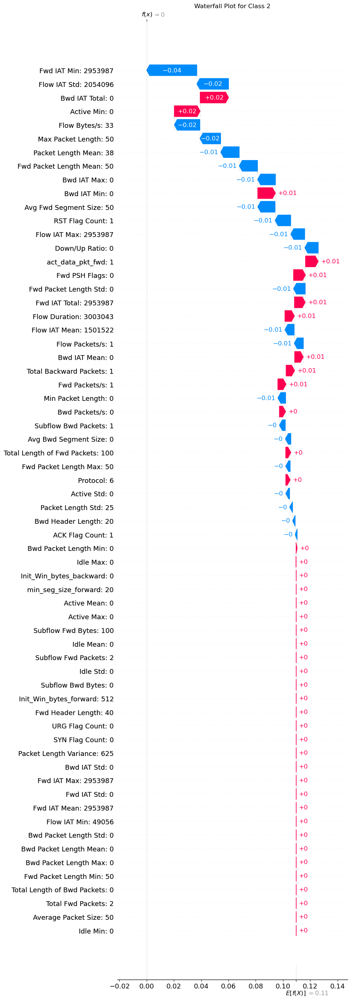

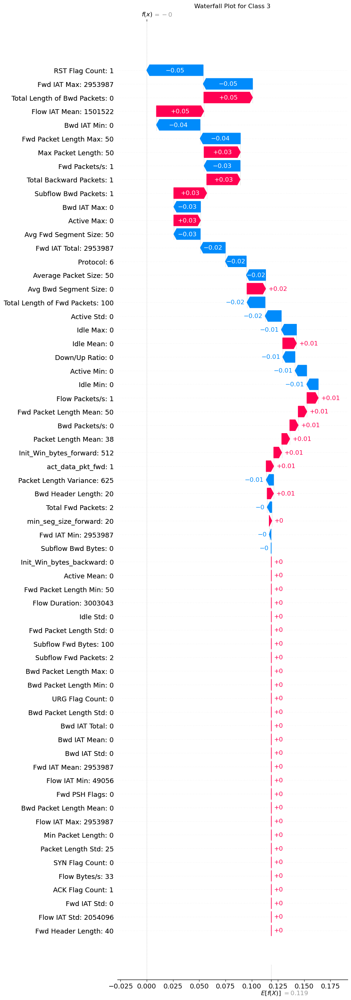

...

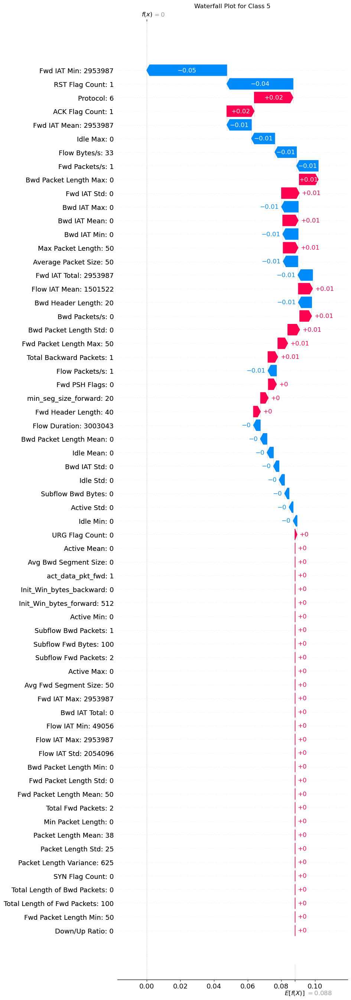

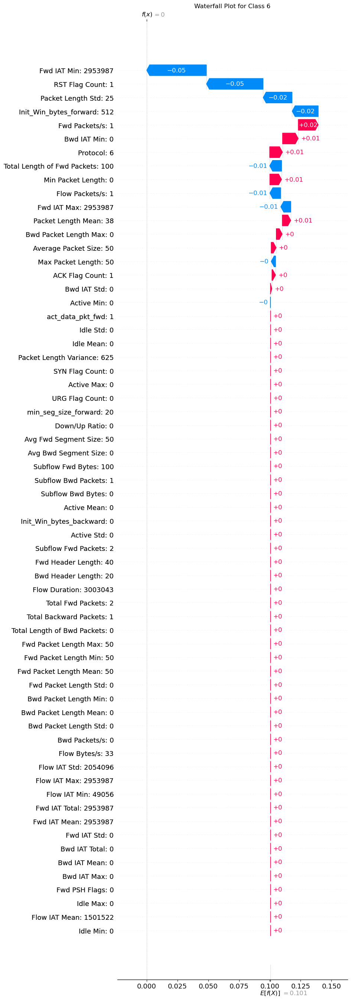

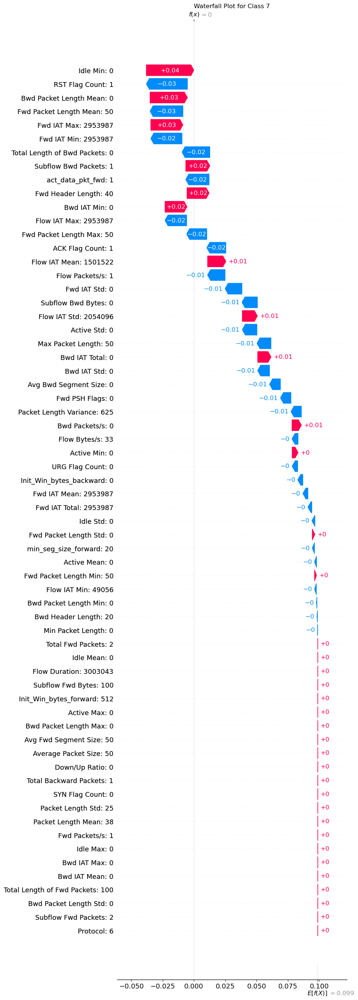

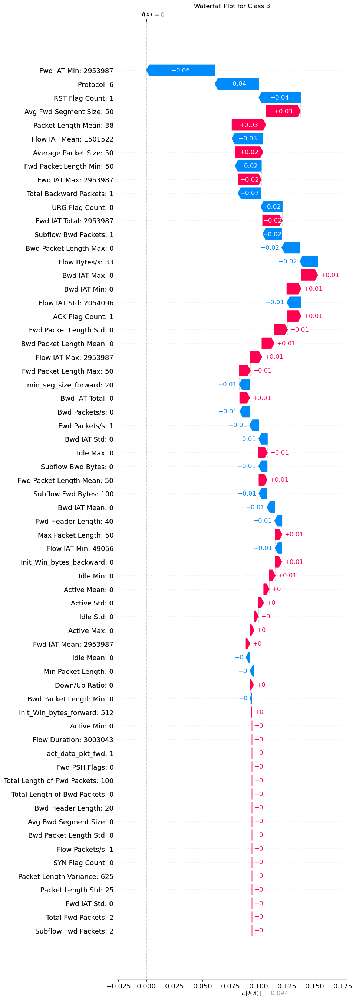

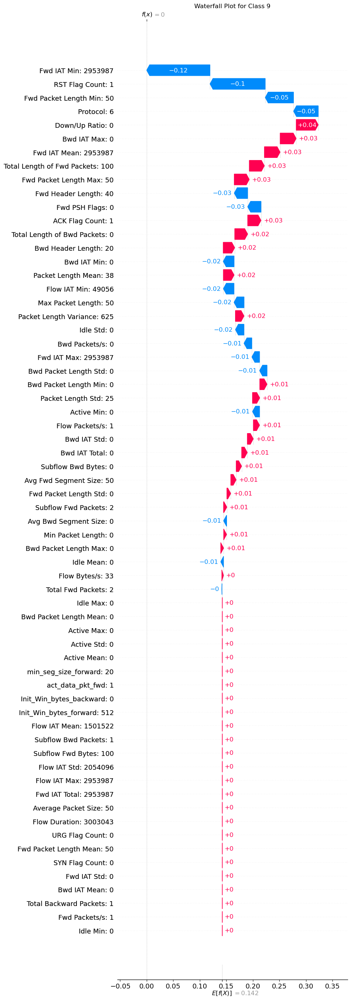

In [37]:
# Selecciona una clase específica para visualizar (por ejemplo, la primera clase)
class_index = 0

# Crea la lista de características con sus valores
feature = [f"{a}: {int(b)}" for a, b in zip(features, data1[num].round(0))]

# Usa el expected_value correspondiente a la clase seleccionada
expected_value_class = explainer.expected_value[class_index]

# Selecciona los valores SHAP para la muestra 'num' y la clase seleccionada
shap_values_class = shap_values[num, :, class_index]

# Crea el gráfico de cascada
shap.plots._waterfall.waterfall_legacy(
    expected_value_class,
    shap_values_class,
    feature_names=feature,
    max_display=80
)

for class_index in range(shap_values.shape[2]):
    plt.figure(figsize=(12, 8))
    plt.title(f"Waterfall Plot for Class {class_index}")
    expected_value_class = explainer.expected_value[class_index]
    shap_values_class = shap_values[num, :, class_index]
    
    shap.plots._waterfall.waterfall_legacy(
        expected_value_class,
        shap_values_class,
        feature_names=feature,
        max_display=80
    )
    
    #plt.tight_layout()
    #plt.show()

In [38]:
#REVISAR
nuevo_shap = np.zeros_like(shap_values[0])
nuevo_data = np.zeros_like(data1[0])
nuevo_min = data1[0].copy()
nuevo_max = np.zeros_like(data1[0])
nuevo_std = np.zeros_like(data1[0])
acum = 0
ata = 2
margen = 0.2

for i in range(size):
    suma = np.sum(shap_values[i]) + np.sum(explainer.expected_value)
    if (ata - abs(margen)) < suma < (ata + abs(margen)):
        nuevo_shap += shap_values[i]
        nuevo_data += data1[i]
        nuevo_min = np.minimum(nuevo_min, data1[i])
        nuevo_max = np.maximum(nuevo_max, data1[i])
        acum += 1

if acum > 0:
    nuevo_shap /= acum
    nuevo_data /= acum

    # Cálculo del STD
    nuevo_std = np.zeros_like(data1[0])
    for i in range(size):
        suma = np.sum(shap_values[i]) + np.sum(explainer.expected_value)
        if (ata - abs(margen)) < suma < (ata + abs(margen)):
            nuevo_std += (data1[i] - nuevo_data) ** 2
    
    nuevo_std = np.sqrt(nuevo_std / acum)

    feature = [f"{a}\n {int(b)} {int(c)} {int(d)} {int(e)}"
               for a, b, c, d, e in zip(features, nuevo_min, nuevo_data, nuevo_std, nuevo_max)]

    print(Labels[ata])
    shap.plots._waterfall.waterfall_legacy(np.sum(explainer.expected_value), nuevo_shap, feature_names=feature, max_display=11)
else:
    print(f"No se encontraron muestras para la clase {Labels[ata]} dentro del margen especificado.")
    print(f"Valor objetivo: {ata}")
    print(f"Margen: {margen}")
    print(f"Rango de suma aceptado: {ata - abs(margen)} a {ata + abs(margen)}")

No se encontraron muestras para la clase DrDoS_SNMP dentro del margen especificado.
Valor objetivo: 2
Margen: 0.2
Rango de suma aceptado: 1.8 a 2.2


#### DECISION TREE

In [39]:
#Decision Tree
from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
from sklearn.model_selection import train_test_split # Import train_test_split function
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

from sklearn import tree


# Assuming X_train, X_test, Y_train, Labels are already defined
# Convert pandas dataframes to numpy arrays if necessary
X_trainArr = X_train.to_numpy() if not isinstance(X_train, np.ndarray) else X_train
X_testArr = X_test.to_numpy() if not isinstance(X_test, np.ndarray) else X_test

# Use LabelEncoder to convert string labels to integers
label_encoder = LabelEncoder()
Y_trainArr = label_encoder.fit_transform(Y_train)

LabelsArr = label_encoder.classes_

# Check if Y_trainArr and LabelsArr are integer arrays and within range
assert np.issubdtype(Y_trainArr.dtype, np.integer), "Y_trainArr must be an integer array"
assert Y_trainArr.min() >= 0 and Y_trainArr.max() < len(LabelsArr), "Y_trainArr values must be within the range of LabelsArr"

# Train the model
n_estimators = 500 #200
clf = RandomForestClassifier(random_state=0, n_estimators=n_estimators, max_depth=6)
clf = clf.fit(X_trainArr, Y_trainArr)

# Predict on the training data
Y_pred = clf.predict(X_trainArr)

# Mapping numerical labels to class labels
y_testree1 = [LabelsArr[i] for i in Y_trainArr]
y_predtree1 = [LabelsArr[i] for i in Y_pred]

# Verify that the lists are not empty
if not y_testree1:
    print("y_testree1 is empty!")
if not y_predtree1:
    print("y_predtree1 is empty!")

# Generate and print the classification report
print(classification_report(y_testree1, y_predtree1, digits=8, zero_division="warn"))

# Print accuracy
accuracy_modelo = accuracy_score(Y_trainArr, Y_pred)
print(accuracy_modelo)

               precision    recall  f1-score   support

       BENIGN  0.99573491 0.99501097 0.99537281     79775
    DrDoS_DNS  0.60428995 0.42793859 0.50104987     79460
   DrDoS_LDAP  0.59331956 0.04316457 0.08047453     79834
  DrDoS_MSSQL  0.50750318 0.45999222 0.48258114     79697
    DrDoS_NTP  0.96374634 0.95477501 0.95923970     79602
DrDoS_NetBIOS  0.69506298 0.31078091 0.42951458     79548
   DrDoS_SNMP  0.57789099 0.87245396 0.69525982     79830
   DrDoS_SSDP  0.44821894 0.23491944 0.30826944     79755
    DrDoS_UDP  0.41311784 0.16501824 0.23583368     79773
         LDAP  0.43994822 0.75777923 0.55669363     79828
        MSSQL  0.48568563 0.56039146 0.52037098     79498
      NetBIOS  0.45364963 0.26809157 0.33701732     79678
      Portmap  0.40109048 0.79058178 0.53218462     79463
          Syn  0.99934634 0.90119648 0.94773703     79734
         TFTP  0.99602336 0.99895901 0.99748903     79732
          UDP  0.38651687 0.78646937 0.51830732     79745
       UDPLag  0

               precision    recall  f1-score   support

       BENIGN  0.99573491 0.99501097 0.99537281     79775
    DrDoS_DNS  0.60428995 0.42793859 0.50104987     79460
   DrDoS_LDAP  0.59331956 0.04316457 0.08047453     79834
  DrDoS_MSSQL  0.50750318 0.45999222 0.48258114     79697
    DrDoS_NTP  0.96374634 0.95477501 0.95923970     79602
DrDoS_NetBIOS  0.69506298 0.31078091 0.42951458     79548
   DrDoS_SNMP  0.57789099 0.87245396 0.69525982     79830
   DrDoS_SSDP  0.44821894 0.23491944 0.30826944     79755
    DrDoS_UDP  0.41311784 0.16501824 0.23583368     79773
         LDAP  0.43994822 0.75777923 0.55669363     79828
        MSSQL  0.48568563 0.56039146 0.52037098     79498
      NetBIOS  0.45364963 0.26809157 0.33701732     79678
      Portmap  0.40109048 0.79058178 0.53218462     79463
          Syn  0.99934634 0.90119648 0.94773703     79734
         TFTP  0.99602336 0.99895901 0.99748903     79732
          UDP  0.38651687 0.78646937 0.51830732     79745
       UDPLag  0

100%|██████████| 500/500 [05:09<00:00,  1.61it/s]


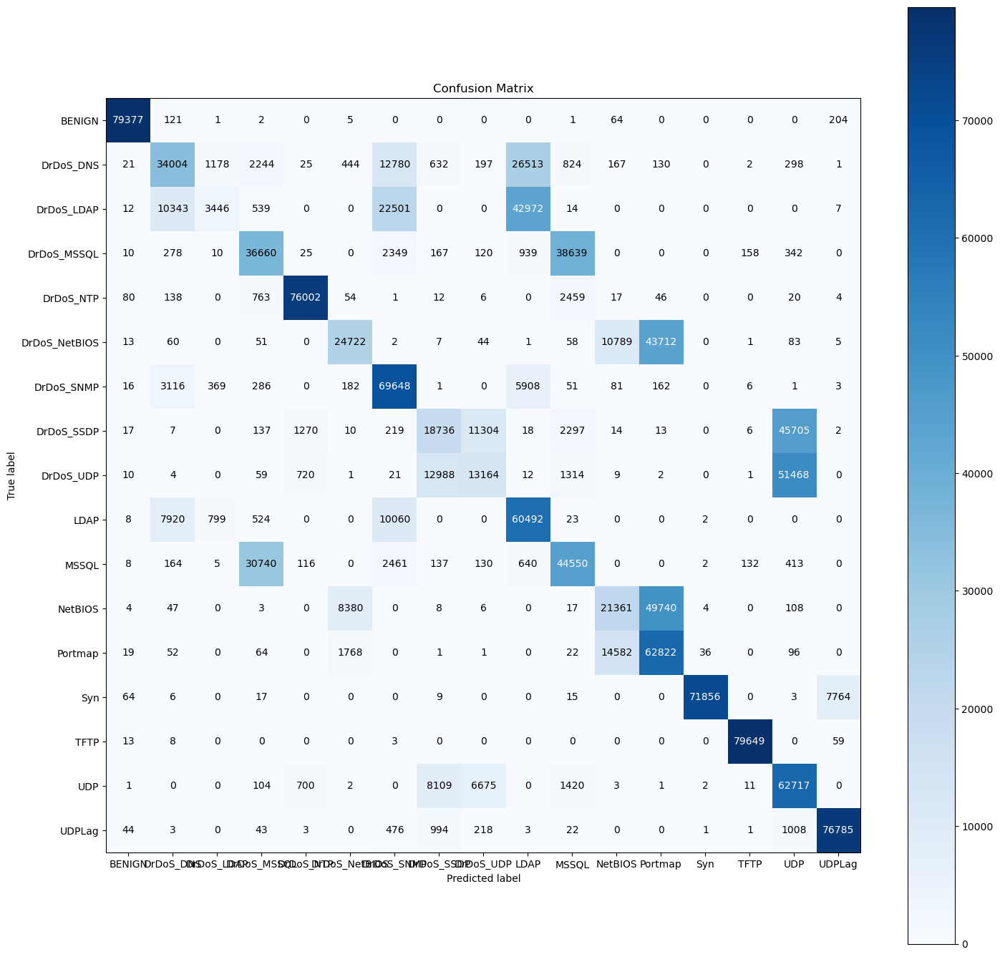

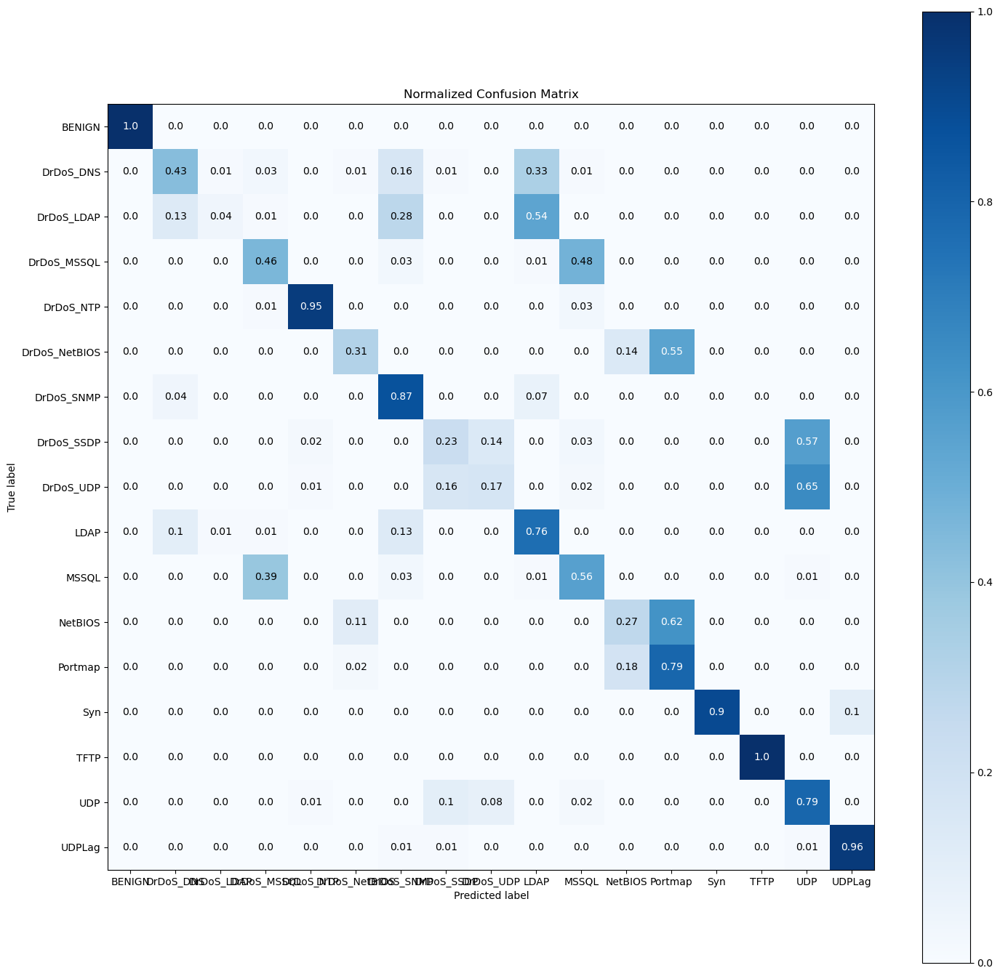

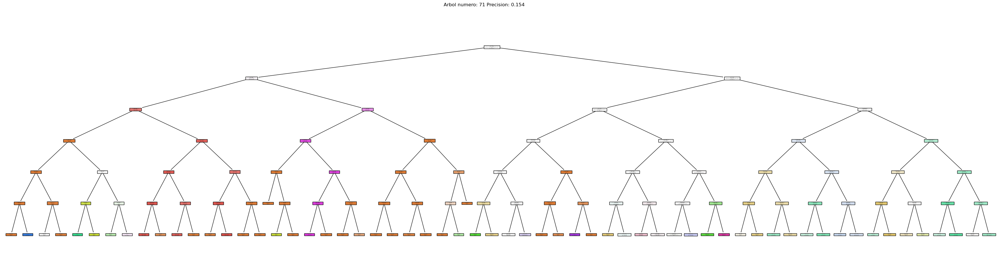

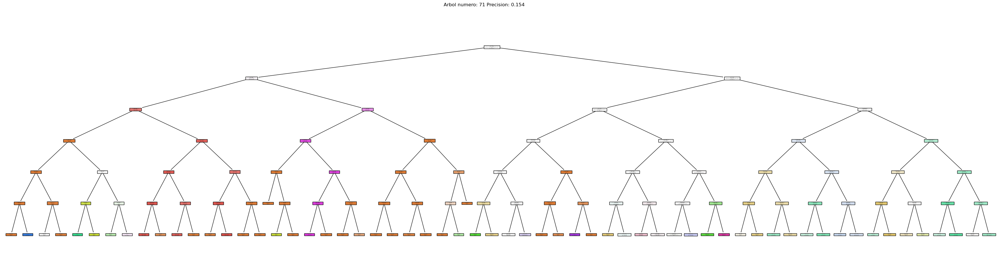

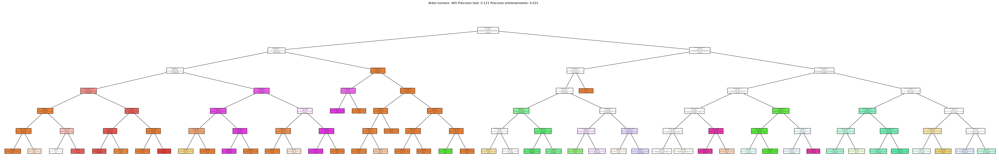

In [40]:
#skplt.metrics.plot_confusion_matrix(y_testree1, y_predtree1,figsize= (17,17))
#skplt.metrics.plot_confusion_matrix(y_testree1, y_predtree1, normalize= True,figsize= (17,17))

import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report
from sklearn.preprocessing import LabelEncoder
from sklearn import tree
import scikitplot as skplt
from tqdm import tqdm

# Assuming X_train, X_test, Y_train, Y_test, Labels, and features are already defined
# Convert pandas dataframes to numpy arrays if necessary
X_trainArr = X_train.to_numpy() if not isinstance(X_train, np.ndarray) else X_train
X_testArr = X_test.to_numpy() if not isinstance(X_test, np.ndarray) else X_test

# Convert Y_train and Y_test to strings
Y_train = Y_train.astype(str)
Y_test = Y_test.astype(str)

# Concatenate Y_train and Y_test to fit the LabelEncoder on both
Y_all = np.concatenate((Y_train, Y_test), axis=0)
label_encoder = LabelEncoder()
Y_all_encoded = label_encoder.fit_transform(Y_all)

# Split Y_all_encoded back into Y_trainArr and Y_testArr
Y_trainArr = Y_all_encoded[:len(Y_train)]
Y_testArr = Y_all_encoded[len(Y_train):]

LabelsArr = label_encoder.classes_.tolist()

# Check if Y_trainArr and LabelsArr are integer arrays and within range
assert np.issubdtype(Y_trainArr.dtype, np.integer), "Y_trainArr must be an integer array"
assert Y_trainArr.min() >= 0 and Y_trainArr.max() < len(LabelsArr), "Y_trainArr values must be within the range of LabelsArr"

# Train the model
n_estimators = 500 #200
clf = RandomForestClassifier(random_state=0, n_estimators=n_estimators, max_depth=6)
clf = clf.fit(X_trainArr, Y_trainArr)

# Predict on the training data
Y_pred = clf.predict(X_trainArr)

# Mapping numerical labels to class labels
y_testree1 = [LabelsArr[i] for i in Y_trainArr]
y_predtree1 = [LabelsArr[i] for i in Y_pred]

# Verify that the lists are not empty
if not y_testree1:
    print("y_testree1 is empty!")
if not y_predtree1:
    print("y_predtree1 is empty!")

# Generate and print the classification report
print(classification_report(y_testree1, y_predtree1, digits=8, zero_division="warn"))

# Print accuracy
accuracy_modelo = accuracy_score(Y_trainArr, Y_pred)
print(accuracy_modelo)

# Plot confusion matrices
skplt.metrics.plot_confusion_matrix(y_testree1, y_predtree1, figsize=(17, 17))
skplt.metrics.plot_confusion_matrix(y_testree1, y_predtree1, normalize=True, figsize=(17, 17))

# Find the best, median, and "pon" estimators
accuracy_ant = 0
accuracy_med = 0
accuracy_pon = 0
accuracy_pon_ant = 0
best = 0
dist_ant = 1000

for i in tqdm(range(n_estimators)):
    aux_clf = clf.estimators_[i]
    y_pred_train = aux_clf.predict(X_trainArr)
    y_pred_test = aux_clf.predict(X_testArr)
    accuracy = accuracy_score(Y_testArr, y_pred_test)
    
    accuracy_train = accuracy_score(Y_trainArr, y_pred_train)
    accuracy_pon = accuracy_train * accuracy
    
    dist = abs(accuracy_modelo - accuracy)
    
    if accuracy_pon > accuracy_pon_ant:
        pon = i
        accuracy_pon_ant = accuracy_pon
        accuracy_pon_train = accuracy_train
        accuracy_pon_test = accuracy
        
    if accuracy > accuracy_ant:
        best = i
        accuracy_ant = accuracy
        
    if dist < dist_ant:
        med = i
        accuracy_med = accuracy
        dist_ant = dist

# Plot the decision trees using the selected indices
fig = plt.figure(figsize=(45, 10))
_ = tree.plot_tree(clf.estimators_[best], feature_names=features, class_names=LabelsArr, filled=True)
fig.suptitle('Arbol numero: ' + str(best) + ' Precision: ' + str(round(accuracy_ant, 3)))
fig.savefig("decision_ataques.pdf")

fig2 = plt.figure(figsize=(45, 10))
_ = tree.plot_tree(clf.estimators_[med], feature_names=features, class_names=LabelsArr, filled=True)
fig2.suptitle('Arbol numero: ' + str(med) + ' Precision: ' + str(round(accuracy_med, 3)))
fig2.savefig("decision_ataques_mean.pdf")

# Ensure pon is defined and then plot the decision tree
if 'pon' in locals():
    fig3 = plt.figure(figsize=(70, 10))
    _ = tree.plot_tree(clf.estimators_[pon], feature_names=features, class_names=LabelsArr, filled=True)
    fig3.suptitle('Arbol numero: ' + str(pon) + ' Precision test: ' + str(round(accuracy_pon_test, 3)) + ' Precision entrenamiento: ' + str(round(accuracy_pon_train, 3)))
    fig3.savefig("decision_ataques_pon.pdf")

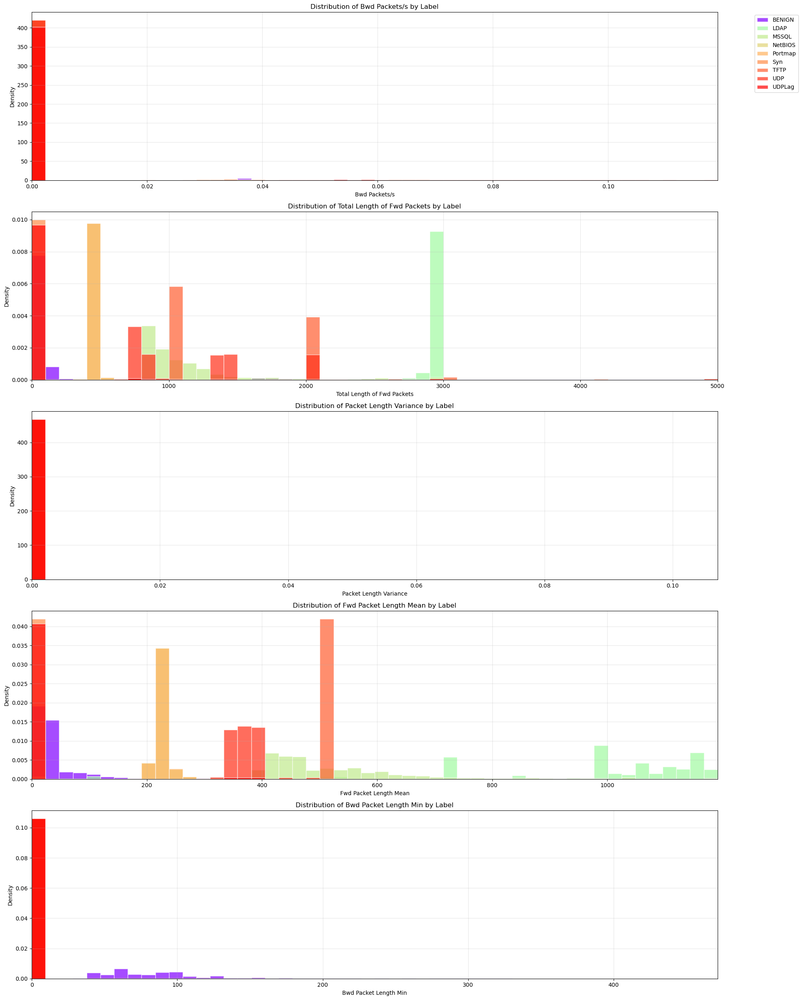


Información sobre los datos:

Característica: Bwd Packets/s
BENIGN: 19754 muestras, rango: 0.0000 - 0.1190
DrDoS_DNS: 0 muestras, rango: nan - nan
DrDoS_LDAP: 0 muestras, rango: nan - nan
DrDoS_MSSQL: 0 muestras, rango: nan - nan
DrDoS_NTP: 0 muestras, rango: nan - nan
DrDoS_NetBIOS: 0 muestras, rango: nan - nan
DrDoS_SNMP: 0 muestras, rango: nan - nan
DrDoS_SSDP: 0 muestras, rango: nan - nan
DrDoS_UDP: 0 muestras, rango: nan - nan
LDAP: 79820 muestras, rango: 0.0000 - 0.0000
MSSQL: 79493 muestras, rango: 0.0000 - 0.0000
NetBIOS: 79674 muestras, rango: 0.0000 - 0.0000
Portmap: 79413 muestras, rango: 0.0000 - 0.0000
Syn: 53746 muestras, rango: 0.0000 - 0.1189
TFTP: 79724 muestras, rango: 0.0000 - 0.0000
UDP: 79743 muestras, rango: 0.0000 - 0.0000
UDPLag: 72478 muestras, rango: 0.0000 - 0.1189

Característica: Total Length of Fwd Packets
BENIGN: 77199 muestras, rango: 0.0000 - 5000.0000
DrDoS_DNS: 0 muestras, rango: nan - nan
DrDoS_LDAP: 0 muestras, rango: nan - nan
DrDoS_MSSQL: 0 muest

In [41]:
import matplotlib.pyplot as plt
import numpy as np

# Asumimos que 'dataset' es tu DataFrame con los datos
# Si no está definido, necesitarás cargar tus datos primero

# Definir las 5 características más destacables y sus límites
top_features = [
    'Bwd Packets/s',
    'Total Length of Fwd Packets',
    'Packet Length Variance',
    'Fwd Packet Length Mean',
    'Bwd Packet Length Min'
]
limits = [0.119, 5000.0, 0.107, 1191.5, 471.5]

# Definir los labels y colores
labels = ["BENIGN", "DrDoS_DNS", "DrDoS_LDAP", "DrDoS_MSSQL", "DrDoS_NTP", "DrDoS_NetBIOS",
          "DrDoS_SNMP", "DrDoS_SSDP", "DrDoS_UDP", "LDAP", "MSSQL", "NetBIOS", "Portmap",
          "Syn", "TFTP", "UDP", "UDPLag"]
colors = plt.cm.rainbow(np.linspace(0, 1, len(labels)))

# Crear la figura
plt.figure(figsize=(20, 25))

# Dibujar los histogramas para cada característica
for i, (feature, limit) in enumerate(zip(top_features, limits), 1):
    plt.subplot(5, 1, i)
    
    for label, color in zip(labels, colors):
        data = dataset[dataset['Label'] == label][feature]
        data = data[data <= limit]  # Aplicar el límite
        if not data.empty:
            plt.hist(data, bins=50, range=(0, limit), density=True, alpha=0.7, 
                     label=label, color=color, edgecolor='white')
    
    plt.xlabel(feature)
    plt.ylabel('Density')
    plt.title(f'Distribution of {feature} by Label')
    plt.xlim(0, limit)
    plt.grid(True, alpha=0.3)
    
    if i == 1:  # Solo añadir leyenda al primer subgráfico
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Ajustar el diseño
plt.tight_layout()

# Mostrar el gráfico
plt.show()

# Imprimir información sobre los datos
print("\nInformación sobre los datos:")
for feature, limit in zip(top_features, limits):
    print(f"\nCaracterística: {feature}")
    for label in labels:
        data = dataset[dataset['Label'] == label][feature]
        data = data[data <= limit]
        print(f"{label}: {len(data)} muestras, rango: {data.min():.4f} - {data.max():.4f}")